In [169]:
import seaborn as sns
import re
import nltk
import random
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import bigrams, trigrams
from nltk.probability import FreqDist
from nltk.stem import PorterStemmer, WordNetLemmatizer
import missingno as msno
from nltk.stem import PorterStemmer, WordNetLemmatizer
import pandas as pd
import matplotlib.pyplot as plt
df= pd.read_excel("Diabetes_Continuous_Glucose_Monitoring.xlsx")

In [170]:
df

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Is Paid,Media Type,URL,Media Link,...,LexisNexis Company - Any,LexisNexis Person - High,LexisNexis Person - Any,LexisNexis Institution - High,LexisNexis Institution - Any,LexisNexis Subject Group 1,LexisNexis Subject 1,LexisNexis Subject Group 2,LexisNexis Subject 2,LexisNexis Other Subjects
0,BRDRDT2-t1_imq98sr,My numbers are great now. Estimated a1c of 7%i...,NaN,Have you been denied a second/third pump? Feel...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BRDRDT2-t1_impbcf4,I tried it for a little while. No side effects...,NaN,Metformin,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1565738759353602048,i ran out of characters. youtu.be/RWgl2PDhQiM ...,NaN,NaN,Twitter,Replies and Comments,No,Link,http://twitter.com/bromid/statuses/15657387593...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17944607459251789,MY lunch! Ate at 10:30am \n1 unit NovoLog insu...,NaN,NaN,Instagram,Original,No,Image,https://www.instagram.com/p/Ch-gqL-Onqk/,https://scontent-iad3-1.cdninstagram.com/v/t51...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BRDRDT2-t1_imq8h9m,This is also because like a soak in a hot tub ...,NaN,"No bath salts, bath oils, soaks?",Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes/comments/x3e...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37839,BRDRDT2-t1_imokb3b,"Push for it, it's a game changer in my opinion...",NaN,If you were magically cured of type I diabetes...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37840,BRDRDT2-t1_imn2fob,(My mom learned to inject my 10 year old self ...,NaN,A question for the older Diabetics.,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37841,BRDRDT2-t1_imod0qi,I just spoke with a rep from Abbott. The rep t...,NaN,Apple IOS 16 public beta,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/Freestylelibre/commen...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37842,17865491111775314,It’s been 2.5 weeks since I started and I’m fe...,NaN,NaN,Instagram,Original,No,No Media,https://www.instagram.com/reel/Ch7ctN_ge5r/,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [171]:
sample_df = df.sample(n=5)

sample_bites = []
for i, row in sample_df.iterrows():
    bite = f"Sound Bite {i+1}: {row['Sound Bite Text']}"
    sample_bites.append(bite)
print('\n\n'.join(sample_bites))

Sound Bite 22895: I was wondering about this, as I'm new to pumping and I dont use my phone, or Dexcom receiver. I called Tandem, and they told me I will get a number of warnings about the transmitter. I haven't gotten any yet, only for the sensors.

Sound Bite 17710: So, what am I missing? After trying everything I could think of, in anything like a meal quantity, Oats send my blood sugar into orbit. So if it does that to me, it does the same thing to other people who are not fortunate enough to own a Freestyle Libre to check their blood sugar by the minute to see what happens over several hours. Consequently, doctors still recommend oats and whole grain breads etc. There is no holiday from that stuff, you just deteriorate at a slower, maybe unnoticeable pace. I notice.

Sound Bite 35763: Got the 780 with the guardian 4 sensor and its is acurate with no need for calibration and works technically very well but the sensor is super flimsy and you pretty much must use the patches they sen

In [172]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37844 entries, 0 to 37843
Data columns (total 63 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Post ID                                      37844 non-null  object 
 1   Sound Bite Text                              37844 non-null  object 
 2   Ratings and Scores                           0 non-null      float64
 3   Title                                        36273 non-null  object 
 4   Source Type                                  37844 non-null  object 
 5   Post Type                                    35165 non-null  object 
 6   Is Paid                                      37844 non-null  object 
 7   Media Type                                   37844 non-null  object 
 8   URL                                          37844 non-null  object 
 9   Media Link                                   1253 non-null   object 
 10

In [173]:
list(df.columns)

['Post ID',
 'Sound Bite Text',
 'Ratings and Scores',
 'Title',
 'Source Type',
 'Post Type',
 'Is Paid',
 'Media Type',
 'URL',
 'Media Link',
 'Domain',
 'Sentiment',
 'Published Date (GMT-04:00) New York',
 'Author Gender',
 'Author URL',
 'Author Name',
 'Author Handle',
 'Author ID',
 'Author Location - Country 1',
 'Author Location - State/Province 1',
 'Author Location - City 1',
 'Author Location - Country 2',
 'Author Location - State/Province 2',
 'Author Location - City 2',
 'Author Location - Other',
 'Author Reddit Karma',
 'Followers/Daily Unique Visitors/Subscribers',
 'Professions',
 'Interests',
 'Positive Objects',
 'Negative Objects',
 'Richness',
 'Tags',
 'Quoted Post',
 'Quoted Author Name',
 'Quoted Author Handle',
 'Total Engagements',
 'Post Comments',
 'Post Likes',
 'Post Shares',
 'Post Views',
 'Post Dislikes',
 'Reddit Score',
 'Product Name',
 'Product Hierarchy',
 'Rating',
 '@Mention Media Tags',
 'Source Name',
 'LexisNexis Source Publisher',
 'LexisN

<Axes: >

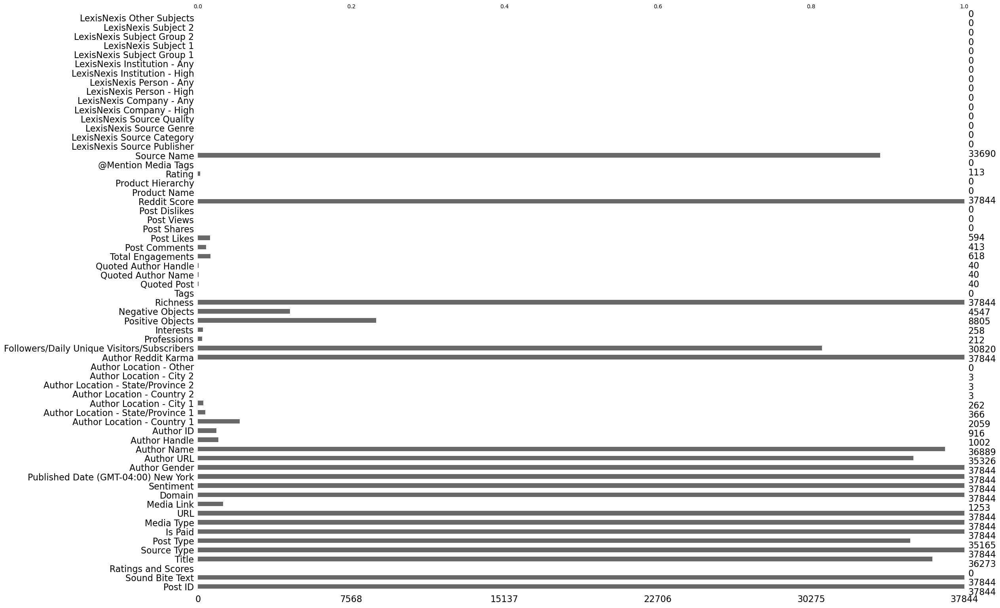

In [174]:
msno.bar(df)

In [175]:
import string
df = df[df['Sound Bite Text'].notnull()] #Remove null values
#Convert to lower case
df['Sound Bite Text'] = df['Sound Bite Text'].str.lower()
df['Sound Bite Text'] = df['Sound Bite Text'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation)))

# Remove stop words
stop_words = set(stopwords.words('english'))
def remove_stopwords(text):
    tokens = text.split()  # Tokenize the text
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]  # Remove stopwords
    return ' '.join(filtered_tokens)
df['Sound Bite Text'] = df['Sound Bite Text'].apply(remove_stopwords)
df

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Is Paid,Media Type,URL,Media Link,...,LexisNexis Company - Any,LexisNexis Person - High,LexisNexis Person - Any,LexisNexis Institution - High,LexisNexis Institution - Any,LexisNexis Subject Group 1,LexisNexis Subject 1,LexisNexis Subject Group 2,LexisNexis Subject 2,LexisNexis Other Subjects
0,BRDRDT2-t1_imq98sr,numbers great estimated a1c 7ish doesnt care s...,NaN,Have you been denied a second/third pump? Feel...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BRDRDT2-t1_impbcf4,tried little side effects help insulin resista...,NaN,Metformin,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1565738759353602048,ran characters youtuberwgl2pdhqim ill also say...,NaN,NaN,Twitter,Replies and Comments,No,Link,http://twitter.com/bromid/statuses/15657387593...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17944607459251789,lunch ate 1030am 1 unit novolog insulin via pu...,NaN,NaN,Instagram,Original,No,Image,https://www.instagram.com/p/Ch-gqL-Onqk/,https://scontent-iad3-1.cdninstagram.com/v/t51...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BRDRDT2-t1_imq8h9m,also like soak hot tub potential exists lowere...,NaN,"No bath salts, bath oils, soaks?",Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes/comments/x3e...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37839,BRDRDT2-t1_imokb3b,push game changer opinion course comes issues ...,NaN,If you were magically cured of type I diabetes...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37840,BRDRDT2-t1_imn2fob,mom learned inject 10 year old self oranges pe...,NaN,A question for the older Diabetics.,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37841,BRDRDT2-t1_imod0qi,spoke rep abbott rep told yet plans update fre...,NaN,Apple IOS 16 public beta,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/Freestylelibre/commen...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37842,17865491111775314,it’s 25 weeks since started i’m feeling better...,NaN,NaN,Instagram,Original,No,No Media,https://www.instagram.com/reel/Ch7ctN_ge5r/,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [176]:
def remove_punc(text):
    punc_pattern = r'[^\w\s]'
    return re.sub(punc_pattern, '', text)

df['Sound Bite Text'] = df['Sound Bite Text'].apply(remove_punc)
df

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Is Paid,Media Type,URL,Media Link,...,LexisNexis Company - Any,LexisNexis Person - High,LexisNexis Person - Any,LexisNexis Institution - High,LexisNexis Institution - Any,LexisNexis Subject Group 1,LexisNexis Subject 1,LexisNexis Subject Group 2,LexisNexis Subject 2,LexisNexis Other Subjects
0,BRDRDT2-t1_imq98sr,numbers great estimated a1c 7ish doesnt care s...,NaN,Have you been denied a second/third pump? Feel...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BRDRDT2-t1_impbcf4,tried little side effects help insulin resista...,NaN,Metformin,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1565738759353602048,ran characters youtuberwgl2pdhqim ill also say...,NaN,NaN,Twitter,Replies and Comments,No,Link,http://twitter.com/bromid/statuses/15657387593...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,17944607459251789,lunch ate 1030am 1 unit novolog insulin via pu...,NaN,NaN,Instagram,Original,No,Image,https://www.instagram.com/p/Ch-gqL-Onqk/,https://scontent-iad3-1.cdninstagram.com/v/t51...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BRDRDT2-t1_imq8h9m,also like soak hot tub potential exists lowere...,NaN,"No bath salts, bath oils, soaks?",Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes/comments/x3e...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37839,BRDRDT2-t1_imokb3b,push game changer opinion course comes issues ...,NaN,If you were magically cured of type I diabetes...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37840,BRDRDT2-t1_imn2fob,mom learned inject 10 year old self oranges pe...,NaN,A question for the older Diabetics.,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37841,BRDRDT2-t1_imod0qi,spoke rep abbott rep told yet plans update fre...,NaN,Apple IOS 16 public beta,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/Freestylelibre/commen...,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37842,17865491111775314,its 25 weeks since started im feeling better l...,NaN,NaN,Instagram,Original,No,No Media,https://www.instagram.com/reel/Ch7ctN_ge5r/,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


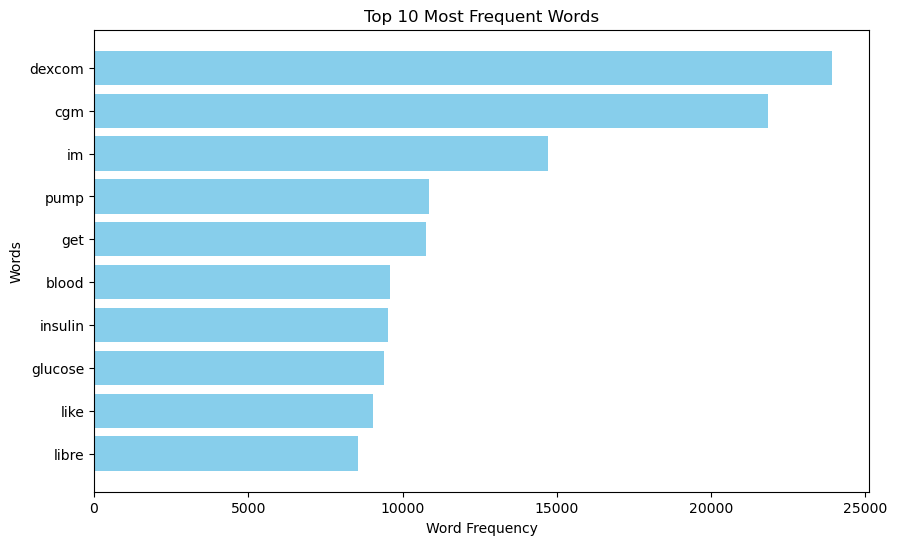

In [177]:
from collections import Counter

# Concatenate all the bites into a single string
all_narratives = ' '.join(df['Sound Bite Text'])

# Tokenize the text and count word frequencies
word_counts = Counter(all_narratives.split())

# Convert the word counts into a list of tuples for sorting
sorted_word_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)

# Extract the top N words and their counts
top_words = [word for word, count in sorted_word_counts[:10]]
top_counts = [count for word, count in sorted_word_counts[:10]]

# Create a horizontal bar chart
plt.figure(figsize=(10, 6))
plt.barh(top_words, top_counts, color='skyblue')
plt.xlabel('Word Frequency')
plt.ylabel('Words')
plt.title('Top 10 Most Frequent Words')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest frequency on top
plt.show()


In [178]:
sorted_word_counts

[('dexcom', 23921),
 ('cgm', 21855),
 ('im', 14720),
 ('pump', 10867),
 ('get', 10751),
 ('blood', 9576),
 ('insulin', 9529),
 ('glucose', 9395),
 ('like', 9041),
 ('libre', 8542),
 ('ive', 8281),
 ('dont', 7581),
 ('use', 7538),
 ('sugar', 7293),
 ('one', 7262),
 ('time', 7165),
 ('would', 6950),
 ('also', 6759),
 ('diabetes', 6177),
 ('sensor', 5542),
 ('low', 5492),
 ('2', 5441),
 ('freestyle', 5441),
 ('know', 5383),
 ('years', 5311),
 ('day', 5220),
 ('its', 5198),
 ('much', 5157),
 ('really', 4877),
 ('got', 4841),
 ('g6', 4792),
 ('using', 4717),
 ('even', 4378),
 ('see', 4341),
 ('insurance', 4069),
 ('continuous', 4052),
 ('go', 4003),
 ('monitor', 3961),
 ('think', 3937),
 ('need', 3921),
 ('good', 3902),
 ('back', 3872),
 ('still', 3740),
 ('app', 3694),
 ('going', 3621),
 ('first', 3606),
 ('since', 3601),
 ('days', 3521),
 ('every', 3466),
 ('well', 3452),
 ('people', 3380),
 ('better', 3375),
 ('new', 3359),
 ('work', 3326),
 ('high', 3299),
 ('phone', 3280),
 ('1', 3238)

In [179]:
#We can remove some frequently occuring words like is an example but it is also helping set the context

frequent_words = ['im', 'ive', 'cgm','glucose']
def remove_frequent_words(text):
    # Split the tweet into words
    words = text.split()
    # Remove frequent words
    words = [word for word in words if word.lower() not in frequent_words and word.lower() not in stop_words]
    # Join the remaining words back into a string
    preprocessed_text = ' '.join(words)
    return preprocessed_text

# Apply the preprocess_text_column function to the text column and store the result in a new column
df['Sound Bite Text'] = df['Sound Bite Text'].apply(remove_frequent_words)

In [180]:
# Tokenize and preprocess the text data
all_narratives = ' '.join(df['Sound Bite Text'])
words = word_tokenize(all_narratives)
words = [word.lower() for word in words if word.isalpha() and word.lower() not in stop_words]

# Now 'words' contains the preprocessed text data without stopwords

# Generate bigrams and trigrams
bigram_list = list(bigrams(words))
trigram_list = list(trigrams(words))

# Calculate frequencies of bigrams and trigrams
bigram_freq = FreqDist(bigram_list)
trigram_freq = FreqDist(trigram_list)

# Print most common bigrams and trigrams
print("Top 10 most common bigrams:")
print(bigram_freq.most_common(10))

print("\nTop 10 most common trigrams:")
print(trigram_freq.most_common(10))

Top 10 most common bigrams:
[(('blood', 'sugar'), 5617), (('freestyle', 'libre'), 4845), (('continuous', 'monitor'), 2632), (('insulin', 'pump'), 1631), (('blood', 'sugars'), 1012), (('dont', 'know'), 893), (('use', 'dexcom'), 869), (('years', 'ago'), 846), (('continuous', 'monitoring'), 789), (('dexcom', 'app'), 761)]

Top 10 most common trigrams:
[(('blood', 'sugar', 'levels'), 496), (('using', 'freestyle', 'libre'), 395), (('use', 'freestyle', 'libre'), 379), (('freestyle', 'libre', 'sensor'), 317), (('low', 'blood', 'sugar'), 304), (('closed', 'loop', 'system'), 293), (('check', 'blood', 'sugar'), 238), (('freestyle', 'libre', 'sensors'), 184), (('high', 'blood', 'sugar'), 160), (('dexcom', 'continuous', 'monitor'), 131)]


In [181]:
# Tokenize the text
df['Tokens'] = df['Sound Bite Text'].apply(lambda x: word_tokenize(x))

# Lemmatize words
lemmatizer = WordNetLemmatizer()
df['Lemmatized'] = df['Tokens'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])

# Display the preprocessed tokens
print(df['Tokens'].head())



0    [numbers, great, estimated, a1c, 7ish, doesnt,...
1    [tried, little, side, effects, help, insulin, ...
2    [ran, characters, youtuberwgl2pdhqim, ill, als...
3    [lunch, ate, 1030am, 1, unit, novolog, insulin...
4    [also, like, soak, hot, tub, potential, exists...
Name: Tokens, dtype: object


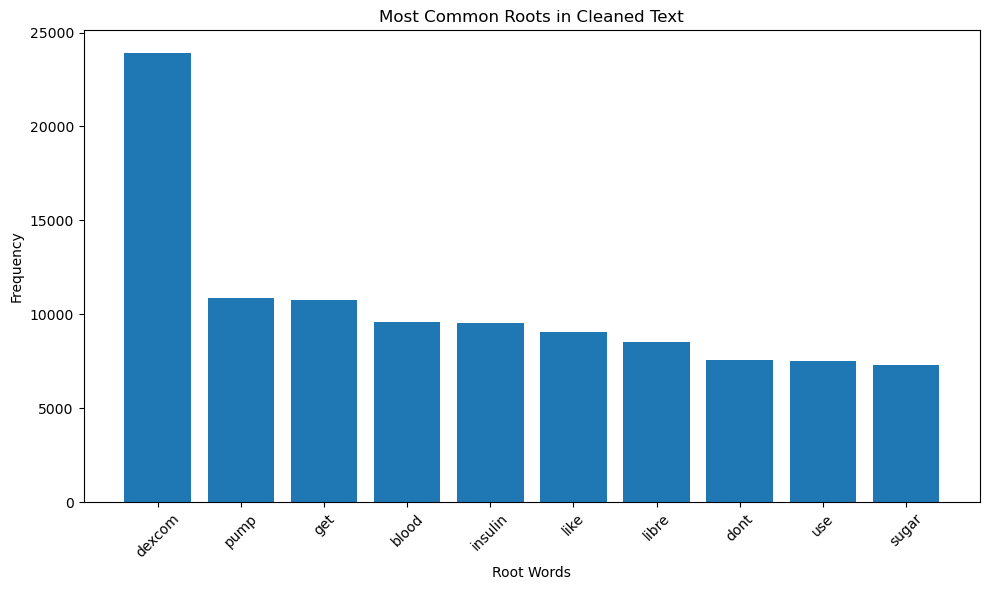

[('dexcom', 23921), ('pump', 10867), ('get', 10751), ('blood', 9576), ('insulin', 9529), ('like', 9041), ('libre', 8542), ('dont', 7581), ('use', 7538), ('sugar', 7293)]


In [182]:
cleaned_words_stemmed = [stem for stems_list in df['Tokens'] for stem in stems_list]

# Use Counter to count the frequency of each root
word_freq = Counter(cleaned_words_stemmed)

# Get the most common roots
most_common_roots = word_freq.most_common(10)  

# Extract the roots and their frequencies for plotting
roots, frequencies = zip(*most_common_roots)

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(roots, frequencies)
plt.xlabel('Root Words')
plt.ylabel('Frequency')
plt.title('Most Common Roots in Cleaned Text')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

print(most_common_roots)

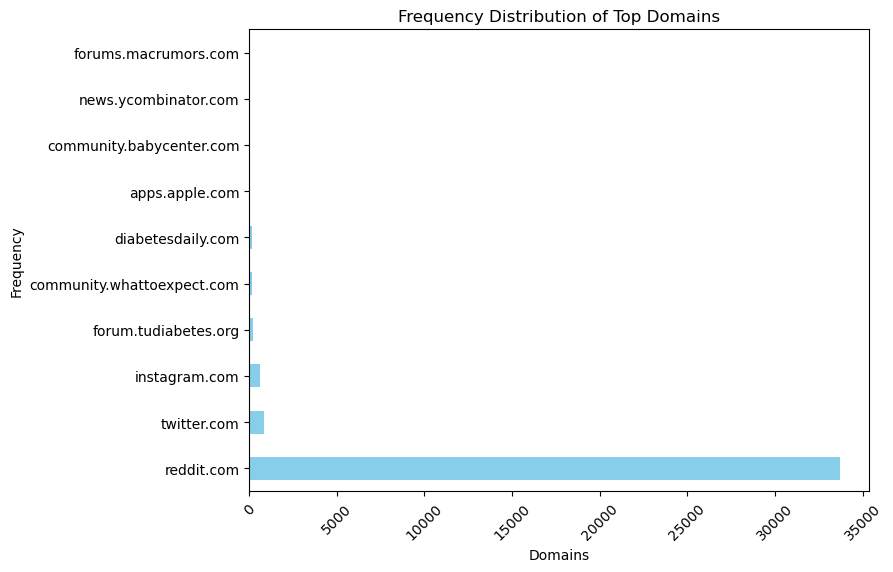

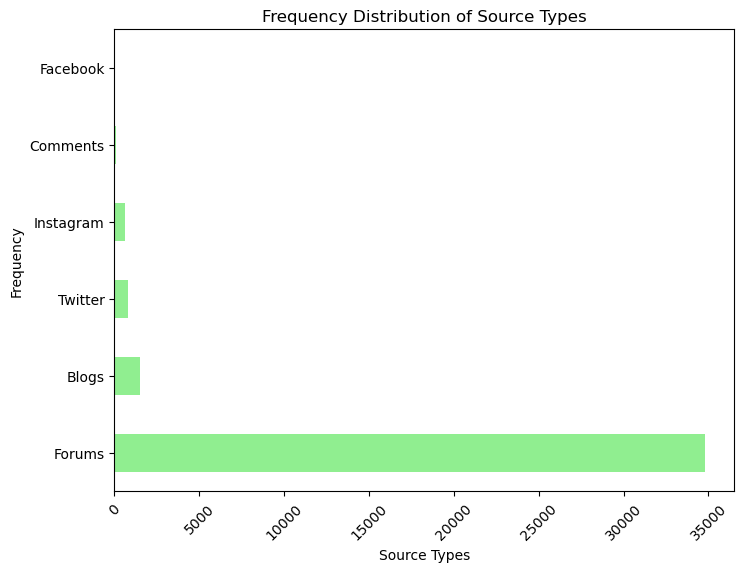

In [183]:
# Frequency distribution of Domain

top_domains= df['Domain'].value_counts().nlargest(10).index.tolist()
df_filtered = df[df['Domain'].isin(top_domains)]
domain_counts_filtered = df_filtered['Domain'].value_counts()

# Plotting domain frequency
plt.figure(figsize=(8, 6))
domain_counts_filtered.plot(kind='barh', color='skyblue')
plt.title('Frequency Distribution of Top Domains')
plt.xlabel('Domains')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Frequency distribution of Source Type
source_type_counts = df['Source Type'].value_counts()

# Plotting source type frequency
plt.figure(figsize=(8, 6))
source_type_counts.plot(kind='barh', color='lightgreen')
plt.title('Frequency Distribution of Source Types')
plt.xlabel('Source Types')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Crosstabulation (frequency counts) between Domain and Source Type
crosstab = pd.crosstab(df['Domain'], df['Source Type'])


Top Authors:
Author Name
melancholalia          218
stinky_harriet         212
scissus1               154
Rockitnonstop          150
Run-And_Gun            139
Jonny_Icon             138
diabetesjunkie         112
KokoPuff12             104
invalid@example.com    101
Makeupanopinion         96
Name: count, dtype: int64


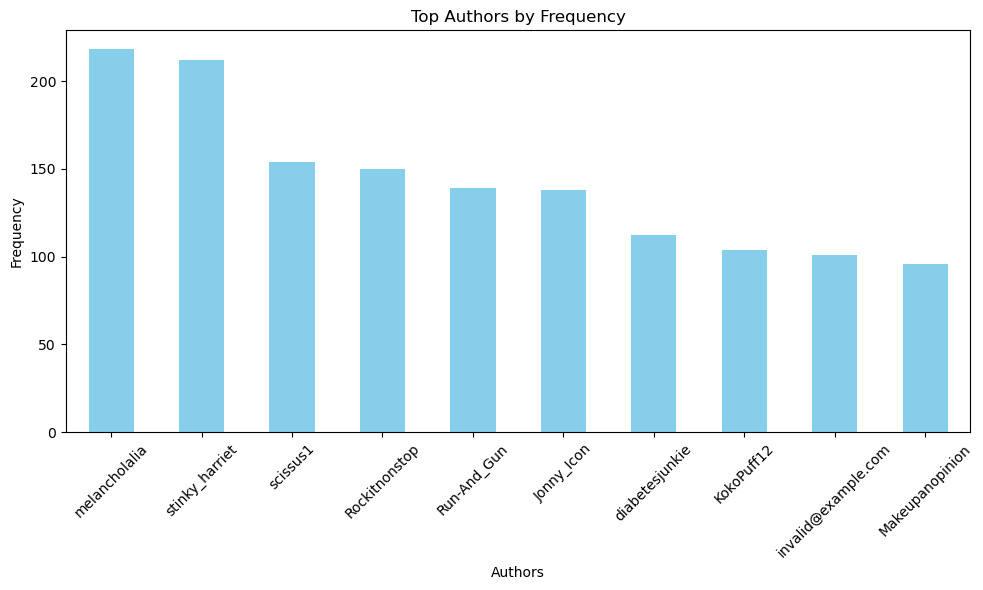

In [184]:

# Get the top authors
top_authors = df['Author Name'].value_counts().nlargest(10)  

# Display the top authors and their frequencies
print("Top Authors:")
print(top_authors)

# Plotting the top authors
plt.figure(figsize=(10, 6))
top_authors.plot(kind='bar', color='skyblue')
plt.title('Top Authors by Frequency')
plt.xlabel('Authors')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [185]:
df['Published Date (GMT-04:00) New York']
df['Published Date'] = pd.to_datetime(df['Published Date (GMT-04:00) New York'])
df['Published Date']

0       2022-09-01 19:41:36
1       2022-09-01 15:53:47
2       2022-09-02 12:29:44
3       2022-09-01 14:20:21
4       2022-09-01 19:35:52
                ...        
37839   2022-09-01 13:00:50
37840   2022-09-01 06:07:02
37841   2022-09-01 12:14:34
37842   2022-08-31 13:43:59
37843   2022-09-01 12:43:40
Name: Published Date, Length: 37844, dtype: datetime64[ns]

The minimum date is: 2021-03-02 14:25:31
The maximum date is: 2022-09-02 13:16:59


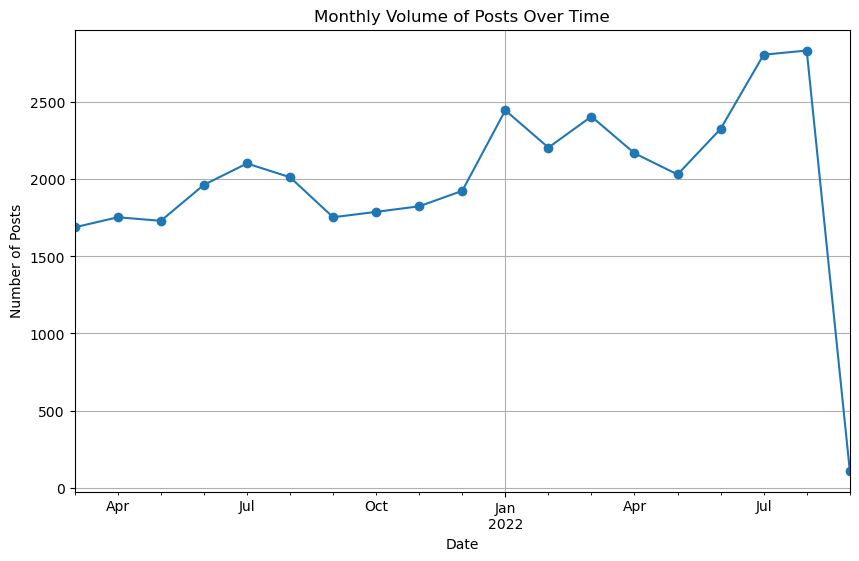

"\n# Sentiment/Engagement Metrics Over Time (Likes and Shares)\nengagement_metrics = df.groupby(df['Published Date'].dt.to_period('M'))[['Likes', 'Shares']].sum()\n\nplt.figure(figsize=(10, 6))\nplt.plot(engagement_metrics.index.to_timestamp(), engagement_metrics['Likes'], label='Likes', marker='o')\nplt.plot(engagement_metrics.index.to_timestamp(), engagement_metrics['Shares'], label='Shares', marker='o')\nplt.title('Engagement Metrics Over Time')\nplt.xlabel('Date')\nplt.ylabel('Count')\nplt.legend()\nplt.grid(True)\nplt.show()\n\n"

In [186]:


minimum_date = df['Published Date'].min()
maximum_date = df['Published Date'].max()

print(f"The minimum date is: {minimum_date}")
print(f"The maximum date is: {maximum_date}")


# Volume of Posts Over Time
plt.figure(figsize=(10, 6))
df.resample('M', on='Published Date').size().plot(marker='o')
plt.title('Monthly Volume of Posts Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Posts')
plt.grid(True)
plt.show()


'''
# Sentiment/Engagement Metrics Over Time (Likes and Shares)
engagement_metrics = df.groupby(df['Published Date'].dt.to_period('M'))[['Likes', 'Shares']].sum()

plt.figure(figsize=(10, 6))
plt.plot(engagement_metrics.index.to_timestamp(), engagement_metrics['Likes'], label='Likes', marker='o')
plt.plot(engagement_metrics.index.to_timestamp(), engagement_metrics['Shares'], label='Shares', marker='o')
plt.title('Engagement Metrics Over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend()
plt.grid(True)
plt.show()

'''

In [187]:
post_counts_monthly = df.resample('M', on='Published Date').size()
post_counts_dict = {f"{date.year}-{date.strftime('%B')}": count for date, count in post_counts_monthly.items()}
print(post_counts_dict)

{'2021-March': 1687, '2021-April': 1752, '2021-May': 1729, '2021-June': 1962, '2021-July': 2100, '2021-August': 2011, '2021-September': 1752, '2021-October': 1787, '2021-November': 1823, '2021-December': 1923, '2022-January': 2444, '2022-February': 2203, '2022-March': 2404, '2022-April': 2166, '2022-May': 2029, '2022-June': 2324, '2022-July': 2804, '2022-August': 2831, '2022-September': 113}


In [188]:
df['Sentiment'].unique()

array(['Neutrals', 'Positives', 'Mixed', 'Negatives'], dtype=object)

In [189]:
neutral_sentiments = df[df['Sentiment'] == 'Neutrals']['Sound Bite Text']
positive_sentiments = df[df['Sentiment'] == 'Positives']['Sound Bite Text']
negative_sentiments = df[df['Sentiment'] == 'Negatives']['Sound Bite Text']
mixed_sentiments = df[df['Sentiment'] == 'Mixed']['Sound Bite Text']


In [190]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Vectorize the text data
vectorizer = CountVectorizer(max_features=1000, lowercase=True)
X = vectorizer.fit_transform(df['Sound Bite Text'])

# Fit an LDA model
num_topics = 10
lda = LatentDirichletAllocation(n_components=num_topics, random_state=42)
lda.fit(X)

# Function to display top words and their probabilities in each topic
def display_topics(model, feature_names, num_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx + 1}:")
        words_prob = [(feature_names[i], round(topic[i], 4)) for i in topic.argsort()[:-num_top_words - 1:-1]]
        print(words_prob)
        print()

# Display top words and their probabilities in each topic
num_top_words = 20
feature_names = vectorizer.get_feature_names()
display_topics(lda, feature_names, num_top_words)


Topic 1:
[('low', 3961.2023), ('high', 1937.486), ('dexcom', 1726.2594), ('night', 1597.6214), ('lows', 1542.9846), ('get', 1534.2663), ('dont', 1348.9181), ('time', 1303.4267), ('go', 1277.0941), ('like', 1256.9321), ('going', 1225.5928), ('insulin', 1004.5731), ('would', 992.544), ('bg', 966.5512), ('eat', 937.479), ('sleep', 911.6978), ('basal', 907.3682), ('also', 898.5327), ('bolus', 865.4149), ('really', 813.7642)]

Topic 2:
[('libre', 8518.748), ('freestyle', 5440.7547), ('sensor', 1473.7865), ('use', 1139.6531), ('using', 884.2209), ('back', 753.7937), ('sensors', 651.6325), ('also', 546.9204), ('14', 541.5744), ('scan', 516.5738), ('one', 497.7249), ('free', 469.543), ('monitoring', 466.6895), ('system', 464.3307), ('reader', 460.7026), ('device', 459.2207), ('abbott', 406.2905), ('get', 395.7273), ('well', 379.8842), ('used', 363.9296)]

Topic 3:
[('years', 4288.3434), ('pump', 3417.2483), ('got', 2354.0565), ('a1c', 2181.0181), ('control', 2137.4178), ('dexcom', 2092.4248), 

In [191]:
X = df['Sound Bite Text']
tf_vectorizer = CountVectorizer(max_df=0.95,
                                min_df=2,
                                stop_words='english')
tf = tf_vectorizer.fit_transform(df['Sound Bite Text'])
num_topics = 6
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components=num_topics, random_state=0)
lda.fit(tf)


LatentDirichletAllocation(n_components=6, random_state=0)

In [192]:
import numpy as np
topic_word_distributions = np.array([row / row.sum() for row in lda.components_])
num_top_words = 15

def print_top_words(topic_word_distributions, num_top_words, vectorizer):
    vocab = vectorizer.get_feature_names_out()
    num_topics = len(topic_word_distributions)
    print('Displaying the top %d words per topic and their probabilities within the topic...' % num_top_words)
    print()

    for topic_idx in range(num_topics):
        print('[Topic ', topic_idx, ']', sep='')
        sort_indices = np.argsort(-topic_word_distributions[topic_idx])
        for rank in range(num_top_words):
            word_idx = sort_indices[rank]
            print(vocab[word_idx], ':',
                  topic_word_distributions[topic_idx, word_idx])
        print()

print_top_words(topic_word_distributions, num_top_words, tf_vectorizer)


Displaying the top 15 words per topic and their probabilities within the topic...

[Topic 0]
libre : 0.023642293818951495
dexcom : 0.01923832291255016
insurance : 0.01604568269442085
freestyle : 0.014675128512740635
use : 0.010185617308405991
dont : 0.00994056541243476
like : 0.00927968123945226
insulin : 0.008833786118761799
know : 0.006787927880213153
people : 0.005997259265376866
need : 0.005902415573929871
pump : 0.005821311205579735
pay : 0.005650855157309675
type : 0.005124706172182432
think : 0.004966761832396285

[Topic 1]
dexcom : 0.05386776389005523
app : 0.03061113033779042
phone : 0.026070701077081652
g6 : 0.01703390498748104
use : 0.014833660584353408
watch : 0.014154570567408464
like : 0.00888522577679434
apple : 0.006925957717824137
work : 0.006620182476417684
using : 0.006506225350013715
data : 0.006383031392830578
omnipod : 0.006261076056342913
iphone : 0.005792766126254515
dont : 0.00545099735856095
time : 0.00531094592473752

[Topic 2]
blood : 0.023121468967325833
di

In [193]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { max-width:100% !important; }</style>"))
display(HTML("<style>.output_result { max-width:100% !important; }</style>"))
display(HTML("<style>.output_area { max-width:100% !important; }</style>"))
display(HTML("<style>.input_area { max-width:100% !important; }</style>"))
vis = pyLDAvis.lda_model.prepare(lda, tf, tf_vectorizer, mds='mmds')
pyLDAvis.display(vis)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


## Interpretation of different topics


Topic 0: Insurance and General Issues

Words: 'libre', 'dexcom', 'insurance', 'freestyle', 'use', 'insulin', 'know', 'people', 'need', 'pump'
Interpretation: This topic seems to revolve around issues related to insurance coverage, usage of Dexcom and Freestyle Libre, insulin usage, and the need for pumps. The discussion might include challenges or experiences regarding insurance coverage for CGM devices and the need for these devices among people.

Topic 1: CGM App and Device Compatibility

Words: 'dexcom', 'app', 'phone', 'g6', 'use', 'watch', 'like', 'apple', 'work', 'using'
Interpretation: This topic appears to focus on discussions about CGM mobile apps, device compatibility (e.g., with phones or smartwatches), usage experiences, and the functionality of Dexcom-related applications.
Topic 2: Blood Sugar Monitoring and Health

Words: 'blood', 'diabetes', 'continuous', 'sugar', 'monitor', 'levels', 'insulin', 'people', 'monitoring', 'health'
Interpretation: This topic encompasses discussions related to diabetes management, continuous blood sugar monitoring, insulin, and the impact of monitoring on health. It seems to cover various aspects of managing blood sugar levels and overall health.

Topic 3: Insulin Pump and Diabetes Control

Words: 'insulin', 'pump', 'years', 'dexcom', 'a1c', 'time', 'control', 'got', 'like', 'life'
Interpretation: This topic is about insulin pumps, diabetes control, experiences over time, A1C levels, and the impact of insulin pumps on life quality and diabetes management.

Topic 4: Blood Sugar Fluctuations and Monitoring Challenges

Words: 'blood', 'sugar', 'low', 'libre', 'like', 'freestyle', 'finger', 'dont', 'day', 'dexcom'
Interpretation: This topic seems to discuss challenges related to blood sugar fluctuations, difficulties in monitoring (possibly due to finger-stick tests), and experiences with CGM devices like Libre and Dexcom.

Topic 5: CGM Sensors and Competing Devices

Words: 'dexcom', 'pump', 'sensor', 'medtronic', 'days', 'sensors', 'time', 'like', 'use', 'new'
Interpretation: This topic involves discussions about CGM sensors, different devices like Dexcom and Medtronic, sensor usage experiences, and the emergence of new sensors or devices.

Regarding patient expectations and knowledge gaps with CGMs, these topics reflect a wide array of discussions. Patients are discussing aspects ranging from the technical details of CGM devices (Topic 0 and 4) to managing blood sugar levels (Topics 1 and 5), insurance concerns (Topic 3), and personal experiences with diabetes and CGMs (Topic 2).

Patient expectations could involve aspects related to device usability, accuracy, insurance coverage, and overall impact on diabetes management. Knowledge gaps might include understanding optimal usage times, interpreting device readings, insurance-related confusion, and seeking advice or insights from others about their experiences with CGMs.

This analysis showcases the diverse topics discussed by patients in online forums, indicating the multifaceted aspects of patient expectations and knowledge gaps regarding CGMs. Further exploration and qualitative analysis of these topics could provide deeper insights into patient expectations and identify specific areas where patients may seek more information or support.

In [194]:

num_topics = 20
lda2 = LatentDirichletAllocation(n_components=num_topics, random_state=0)
lda2.fit(tf)


LatentDirichletAllocation(n_components=20, random_state=0)

In [195]:
#Displaying the results for 20 topics
vis2 = pyLDAvis.lda_model.prepare(lda2, tf, tf_vectorizer, mds='mmds')
pyLDAvis.display(vis2)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


### Explanation of the Visualisation

Topic Listing: The left side of the visualization displays a list of topics. Each circle represents a topic. The size of the circle indicates the prevalence of the topic in the corpus.

Inter-Topic Distance Map: The plot on the right shows the relative distance between topics. Closer topics have more overlapping terms.

Term Frequencies: When you hover over a topic circle, on the right side, a bar chart appears. It shows the most relevant terms for that topic. The terms are ordered by their frequency in the corpus (i.e., within the topic).

Intertopic Distance Plot (MD scaling): This plot provides a two-dimensional representation of the topic dissimilarities. The distance between topics reflects their similarity, where similar topics are closer together.

Relevance and Frequency Sliders: These sliders allow adjusting the terms shown based on relevance (λ) and term frequency (cutoff).


- Topic Prevalence: Larger circles indicate more prevalent topics in the corpus.
- Term Importance: The relevance of terms within each topic helps understand what the topic is about. The terms closer to the center of the circle are more representative of that specific topic.
- Topic Overlaps: Overlapping terms between topics might suggest ambiguity or shared concepts between those topics.
- Topic Distance: The distance between topics in the map indicates how similar or dissimilar they are. Closer topics share more terms or are more related.

In [196]:
def compute_average_num_unique_words(topic_word_distributions, num_top_words, vectorizer, verbose=True):
    vocab = vectorizer.get_feature_names_out()
    num_topics = len(topic_word_distributions)
    average_number_of_unique_top_words = 0
    for topic_idx1 in range(num_topics):
        if verbose:
            print('[Topic ', topic_idx1, ']', sep='')
        
        sort_indices1 = np.argsort(topic_word_distributions[topic_idx1])[::-1]
        num_unique_top_words = 0
        for top_word_idx1 in sort_indices1[:num_top_words]:
            word1 = vocab[top_word_idx1]
            break_ = False
            for topic_idx2 in range(num_topics):
                if topic_idx1 != topic_idx2:
                    sort_indices2 = np.argsort(topic_word_distributions[topic_idx2])[::-1]
                    for top_word_idx2 in sort_indices2[:num_top_words]:
                        word2 = vocab[top_word_idx2]
                        if word1 == word2:
                            break_ = True
                            break
                    if break_:
                        break
            else:
                num_unique_top_words += 1
        if verbose:
            print('Number of unique top words:', num_unique_top_words)
            print()

        average_number_of_unique_top_words += num_unique_top_words
    average_number_of_unique_top_words /= num_topics
    
    if verbose:
        print('Average number of unique top words:', average_number_of_unique_top_words)
    
    return average_number_of_unique_top_words
compute_average_num_unique_words(topic_word_distributions, num_top_words, tf_vectorizer, True)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Number of unique top words: 8

[Topic 2]
Number of unique top words: 6

[Topic 3]
Number of unique top words: 7

[Topic 4]
Number of unique top words: 4

[Topic 5]
Number of unique top words: 8

Average number of unique top words: 6.166666666666667


6.166666666666667

In [197]:
def log_prob_see_word1_given_see_word2(word1, word2, vectorizer, eps=0.1):
    word1_column_idx = vectorizer.vocabulary_[word1]
    word2_column_idx = vectorizer.vocabulary_[word2]
    documents_with_word1 = (tf[:, word1_column_idx].toarray().flatten() > 0)
    documents_with_word2 = (tf[:, word2_column_idx].toarray().flatten() > 0)
    documents_with_both_word1_and_word2 = documents_with_word1 * documents_with_word2
    return np.log2((documents_with_both_word1_and_word2.sum() + eps) / documents_with_word2.sum())

def compute_average_coherence(topic_word_distributions, num_top_words, vectorizer, verbose=True):
    vocab = vectorizer.get_feature_names_out()
    num_topics = len(topic_word_distributions)
    average_coherence = 0
    for topic_idx in range(num_topics):
        if verbose:
            print('[Topic ', topic_idx, ']', sep='')
        
        sort_indices = np.argsort(topic_word_distributions[topic_idx])[::-1]
        coherence = 0.
        for top_word_idx1 in sort_indices[:num_top_words]:
            word1 = vocab[top_word_idx1]
            for top_word_idx2 in sort_indices[:num_top_words]:
                word2 = vocab[top_word_idx2]
                if top_word_idx1 != top_word_idx2:
                    coherence += log_prob_see_word1_given_see_word2(word1, word2, vectorizer, 0.1)
        
        if verbose:
            print('Coherence:', coherence)
            print()
        average_coherence += coherence
    average_coherence /= num_topics
    if verbose:
        print('Average coherence:', average_coherence)
    return average_coherence
compute_average_coherence(topic_word_distributions, num_top_words, tf_vectorizer, True)

[Topic 0]
Coherence: -564.7750899013371

[Topic 1]
Coherence: -633.4370311954671

[Topic 2]
Coherence: -538.2044893892829

[Topic 3]
Coherence: -530.7066932343145

[Topic 4]
Coherence: -535.7548799592637

[Topic 5]
Coherence: -600.3202389188863

Average coherence: -567.1997370997586


-567.1997370997586

In [198]:

k_values = range(2, 11)
avg_coherences = []
avg_num_unique_words = []

for k in k_values:
    lda_candidate = LatentDirichletAllocation(n_components=k, random_state=0)
    lda_candidate.fit(tf)
    topic_word_distributions = np.array([row / row.sum() for row in lda_candidate.components_])
    '''
    print('-' * 80)
    print('Number of topics:', k)
    print()
    print_top_words(topic_word_distributions, num_top_words, tf_vectorizer)
    print()
    print()
    '''
    avg_coherences.append(compute_average_coherence(topic_word_distributions, num_top_words, tf_vectorizer, False))
    avg_num_unique_words.append(compute_average_num_unique_words(topic_word_distributions, num_top_words, tf_vectorizer, False))


Text(0, 0.5, 'Average coherence')

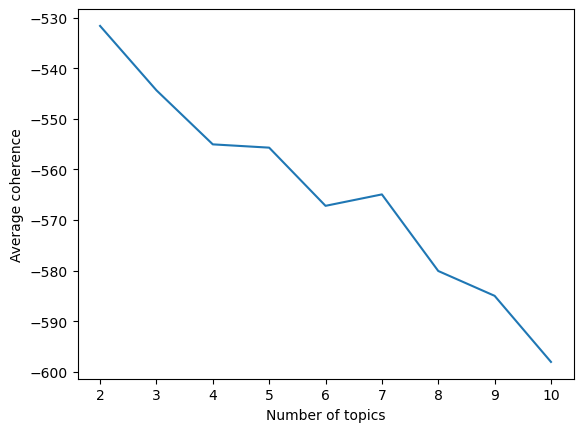

In [199]:
plt.plot(k_values, avg_coherences)
plt.xlabel('Number of topics')
plt.ylabel('Average coherence')

Text(0, 0.5, 'Average number of unique words')

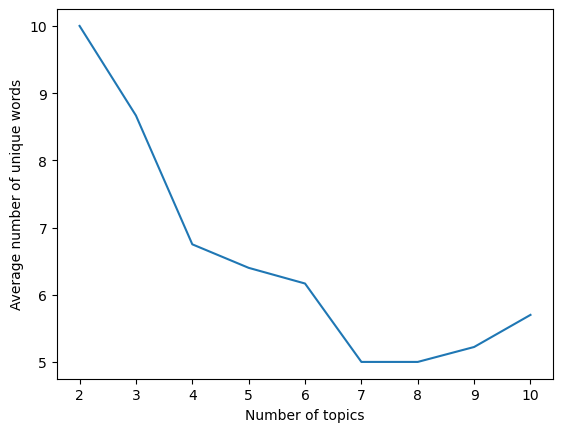

In [200]:
plt.plot(k_values, avg_num_unique_words)
plt.xlabel('Number of topics')
plt.ylabel('Average number of unique words')

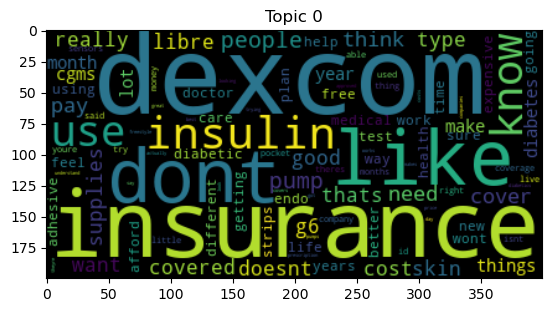

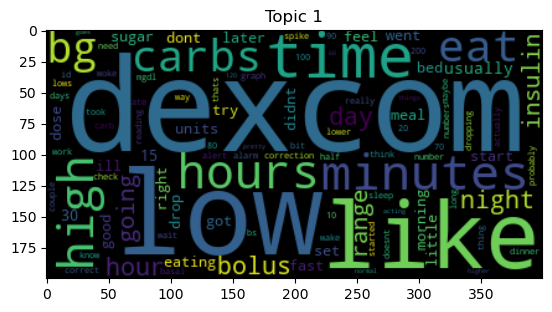

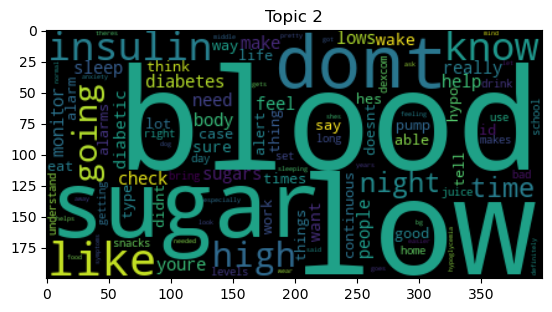

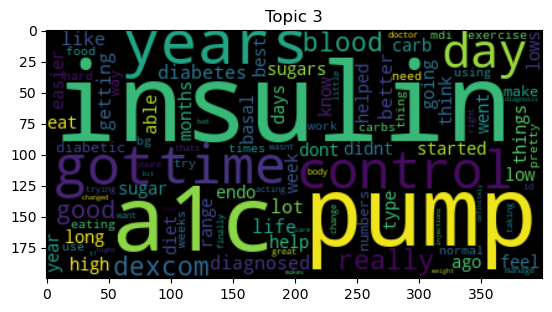

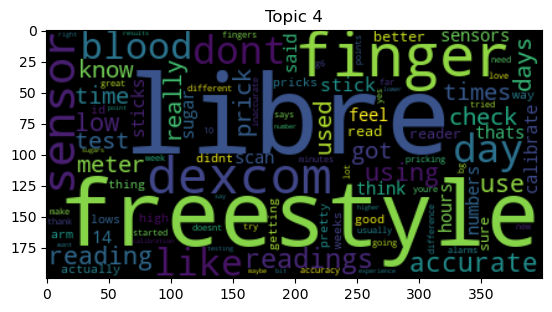

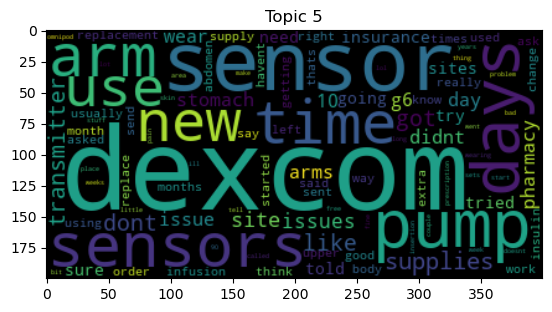

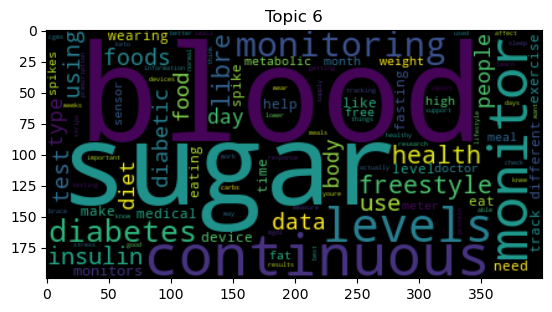

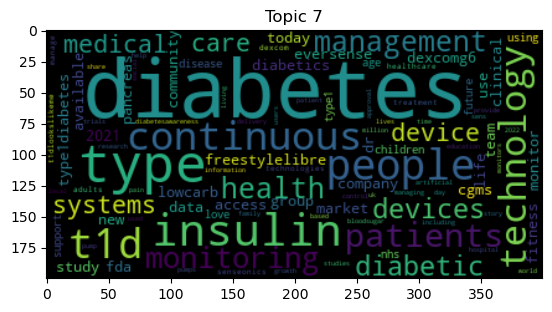

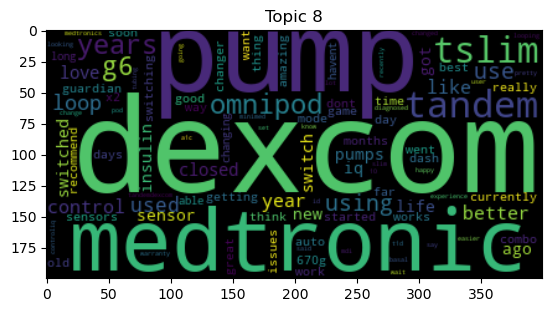

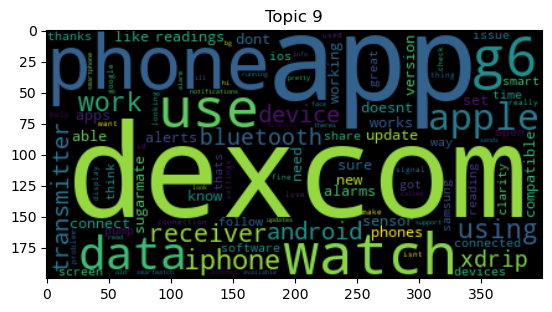

In [201]:
from wordcloud import WordCloud

num_max_word_cloud_words = 100

vocab = tf_vectorizer.get_feature_names_out()
num_topics = len(topic_word_distributions)

for topic_idx in range(num_topics):
    wc = WordCloud(max_words=num_max_word_cloud_words)
    wc.generate_from_frequencies(dict(zip(vocab, topic_word_distributions[topic_idx])))
    plt.figure()
    plt.imshow(wc, interpolation='bilinear')
    plt.title('Topic %d' % topic_idx)

In [202]:
doc_topic_probs = lda.transform(tf)

In summary, we have the following set of topics that we intend to visualize over time

- Topic 0 - Insurance and User Concerns: Insurance coverage issues, user experiences, and concerns about device use.
- Topic 1 - App, Devices and Tools: Discussion around Dexcom app, phone compatibility, and device usability.
- Topic 2 - Health Monitoring and Diabetes Management: Focus on health monitoring, diabetes management, and continuous glucose monitoring, insuline levels.
- Topic 3 - Insulin Pump and Diabetes Control: Sentiments about insulin pumps, diabetes control, and managing A1C levels.
- Topic 4 - Blood Sugar Monitoring Challenges, Reliability: Discussions on blood sugar monitoring, device reliability, and monitoring difficulties.
- Topic 5 - Device Comparisons and New Implementations: Discussions involving comparisons with other devices, sensor usage, and mentions of different brands or implementations in diabetes management.


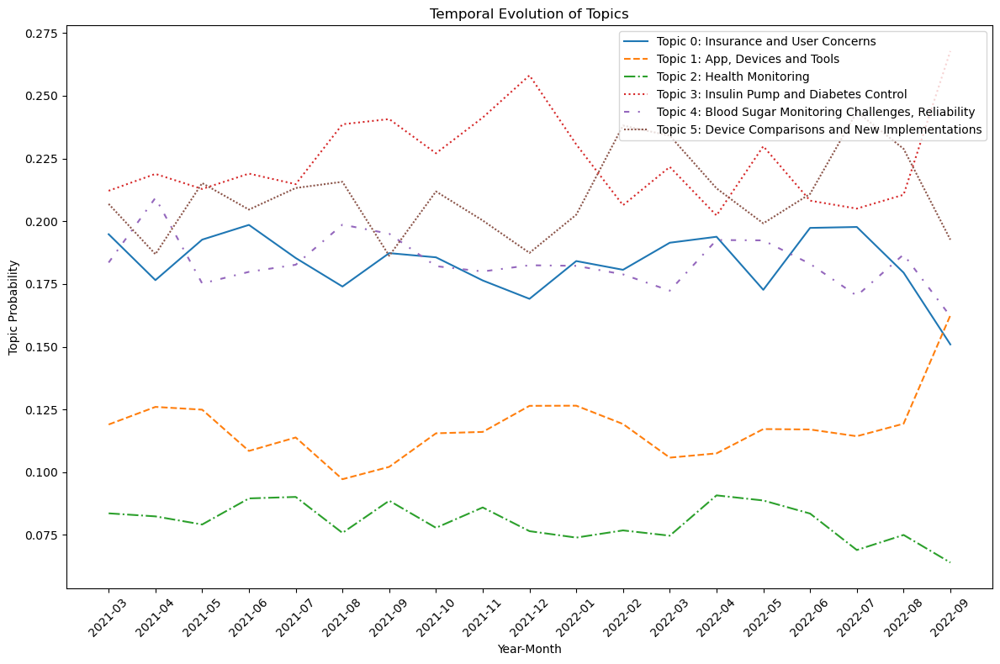

In [203]:
data = pd.DataFrame(doc_topic_probs, columns=[f"Topic_{i}" for i in range(doc_topic_probs.shape[1])])
data['Year_Month'] = df['Published Date'].dt.to_period('M').astype(str)
topic_evolution = data.groupby('Year_Month').mean()

line_styles = ['-', '--', '-.', ':', (0, (3, 5, 1, 5)), (0, (1, 1))]
# Plot temporal evolution for each topic with labels
plt.figure(figsize=(12, 8))
for i in range(6): 
    plt.plot(topic_evolution[f'Topic_{i}'], label=f'Topic {i}: {"Insurance and User Concerns" if i == 0 else "App, Devices and Tools" if i == 1 else "Health Monitoring" if i == 2 else "Insulin Pump and Diabetes Control" if i == 3 else "Blood Sugar Monitoring Challenges, Reliability" if i == 4 else "Device Comparisons and New Implementations"}', linestyle=line_styles[i])

plt.xlabel('Year-Month')
plt.ylabel('Topic Probability')
plt.title('Temporal Evolution of Topics')
plt.legend(loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Intepretation of the plot

The X-axis in the temporal evolution plot represents the time period. 

The Y-axis represents the probability or prevalence of a particular topic within the discussions during that time interval. Each line in the plot represents the evolution of a specific topic over time. The Y-axis value at a given point for a particular topic indicates the prevalence or likelihood of that topic being discussed during that specific period.

Rising or Falling Trends: An increasing trend for a topic's line indicates a growing prevalence of discussions related to that topic over time. Conversely, a decreasing trend suggests a decline in discussions about that topic.

Spikes or Peaks: Sudden spikes or peaks in a topic's line suggest a sudden surge in discussions related to that topic during a specific time period. This could be due to an event, news, or any other influential factor relevant to the topic.

Consistent Patterns: Consistency or periodic patterns in the lines might indicate recurring discussions or periodic trends in the topic's prevalence.

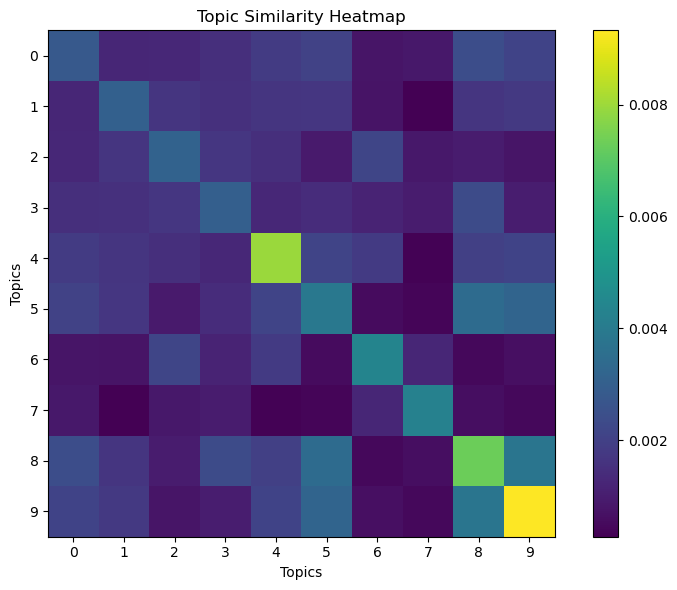

In [204]:
num_topics = len(topic_word_distributions)
topic_similarity = np.zeros((num_topics, num_topics))

for i in range(num_topics):
    for j in range(num_topics):
        topic_similarity[i][j] = np.dot(topic_word_distributions[i], topic_word_distributions[j])
        
# Plot the heatmap
plt.figure(figsize=(8, 6))
plt.imshow(topic_similarity, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.title('Topic Similarity Heatmap')
plt.xlabel('Topics')
plt.ylabel('Topics')
plt.xticks(np.arange(num_topics))
plt.yticks(np.arange(num_topics))
plt.tight_layout()
plt.show()

In [205]:
#Benefits of GCM and Unmet Needs
from nltk.sentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

def get_sentiment_score(stem_list):
    stemmed_text = ' '.join(stem_list)
    return analyzer.polarity_scores(stemmed_text)['compound']

# Apply sentiment analysis to the 'Stemmed Text' column
df['Sentiment Score'] = df['Tokens'].apply(get_sentiment_score)

# Define the sentiment ranges and assign scores
def assign_sentiment(score):
    if score < -0.5:
        return 1
    elif -0.5 <= score < -0.1:
        return 2
    elif -0.1 <= score < 0.1:
        return 3
    elif 0.1 <= score < 0.5:
        return 4
    else:
        return 5


df['Sentiment Score (1-5)'] = df['Sentiment Score'].apply(assign_sentiment)



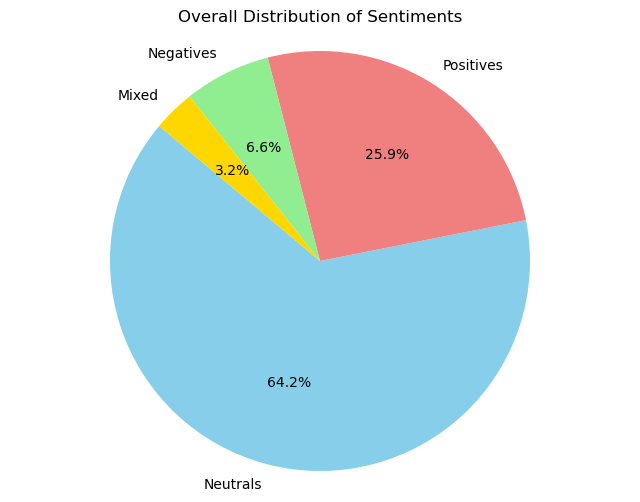

In [206]:
import matplotlib.pyplot as plt

sentiment_counts = df['Sentiment'].value_counts()

labels = sentiment_counts.index
sizes = sentiment_counts.values

plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral', 'lightgreen', 'gold'])
plt.title('Overall Distribution of Sentiments')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

In [207]:
#Identifying Specific Specific Words that lead to different sentiments
positive_words = []
negative_words = []
neutral_words = []
mixed_words = []

for index, row in df.iterrows():
    words = row['Lemmatized']  
    sentiment = row['Sentiment'] 
    if sentiment == 'Positives':
        positive_words.extend(words)
    elif sentiment == 'Negatives':
        negative_words.extend(words)
    elif sentiment == 'Neutrals':
        neutral_words.extend(words)
    elif sentiment == 'Mixed':
        mixed_words.extend(words)

positive_words = list(set(positive_words))
negative_words = list(set(negative_words))
neutral_words = list(set(neutral_words))
mixed_words = list(set(mixed_words))



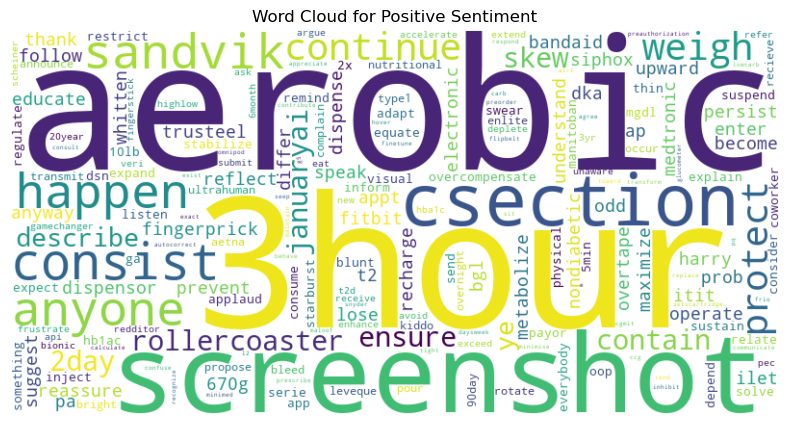

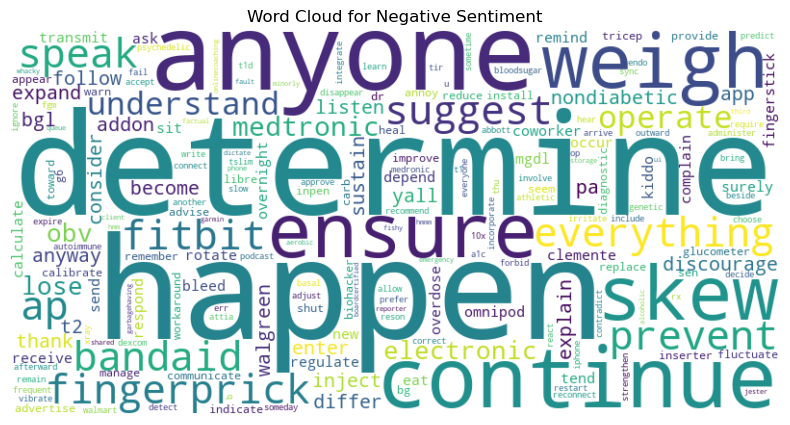

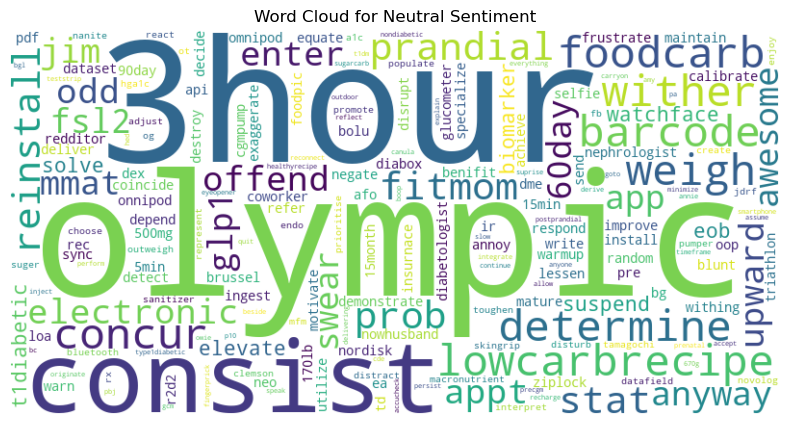

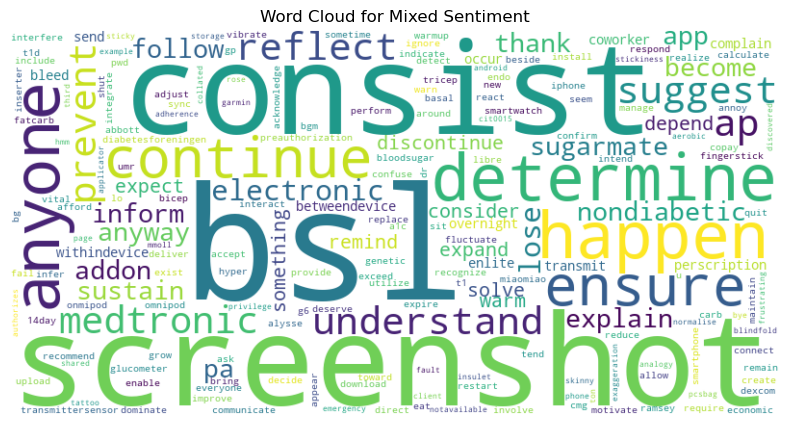

In [208]:

import matplotlib.pyplot as plt


# Generate word clouds for different sentiments
def generate_wordcloud(words, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(words))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

generate_wordcloud(positive_words, 'Word Cloud for Positive Sentiment')
generate_wordcloud(negative_words, 'Word Cloud for Negative Sentiment')
generate_wordcloud(neutral_words, 'Word Cloud for Neutral Sentiment')
generate_wordcloud(mixed_words, 'Word Cloud for Mixed Sentiment')

In [209]:
from collections import Counter

def top_words(sentiment_words, sentiment):
    word_counts = Counter(sentiment_words)
    top_words = word_counts.most_common(30)
    print(f"Top 30 words in {sentiment} sentiment:")
    print(top_words)

top_words(positive_words, 'Positive')
top_words(negative_words, 'Negative')
top_words(neutral_words, 'Neutral')
top_words(mixed_words, 'Mixed')


Top 30 words in Positive sentiment:
[('integrates', 1), ('dietthe', 1), ('stickiness', 1), ('5862', 1), ('tbsp', 1), ('alcoholic', 1), ('wahoooo', 1), ('cheapthoughts', 1), ('leon', 1), ('preemptively', 1), ('irksome', 1), ('systematically', 1), ('bsl', 1), ('suzanne', 1), ('westiebichon', 1), ('third', 1), ('115', 1), ('factual', 1), ('hmm', 1), ('trusteels', 1), ('adherence', 1), ('95', 1), ('aerobic', 1), ('1012mgdl', 1), ('dosecorrect', 1), ('ui', 1), ('procrastinating', 1), ('fishy', 1), ('objection', 1), ('httpswwwfreestyleabbottusenproductsfreestylelibre2html', 1)]
Top 30 words in Negative sentiment:
[('integrates', 1), ('alcoholic', 1), ('whacky', 1), ('third', 1), ('115', 1), ('factual', 1), ('hmm', 1), ('95', 1), ('aerobic', 1), ('ui', 1), ('fishy', 1), ('onlinecoaching', 1), ('down', 1), ('fault', 1), ('shared', 1), ('reporter', 1), ('queue', 1), ('emergency', 1), ('boardcertified', 1), ('client', 1), ('jester', 1), ('dictate', 1), ('minorly', 1), ('hmmm', 1), ('garmin', 1),

In [210]:
#Fitting a Machine Learning Model to the Data
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Step 1: Feature Extraction
vectorizer = TfidfVectorizer(max_features=1000)
X = vectorizer.fit_transform(df['Sound Bite Text'])

# Step 2: Model Selection (Random Forest Classifier)
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Step 3: Training and Testing
X_train, X_test, y_train, y_test = train_test_split(X, df['Sentiment'], test_size=0.3, random_state=42)
model.fit(X_train, y_train)
accuracy = model.score(X_test, y_test)
print(f"Accuracy: {accuracy}\n")

sound_bites = df['Sound Bite Text'].sample(n=10)

sound_bites_X = vectorizer.transform(sound_bites)
predictions = model.predict(sound_bites_X)

for i, (sound_bites, prediction) in enumerate(zip(sound_bites, predictions)):
    print(f"\nSound Bite Text {i+1}: {sound_bites}")
    print(f"Predicted Sentiment: {prediction}\n")
    


Accuracy: 0.6633785450061652


Sound Bite Text 1: day 97 range weve told keep range 50 time thats good days even thats challenge honey great way quickly get start go low presume brother year old dont give honey keep eye dexcom couldnt imagine without theres also rtype1diabetes obviously specific type 1 may help think lot us hang though
Predicted Sentiment: Neutrals


Sound Bite Text 2: congrats t1d 16 years 4 years ago got dexcom absolutely changed life month gonna get tandem tslim pump communicates dexcom shut going low
Predicted Sentiment: Neutrals


Sound Bite Text 3: helpful thread common okay arrive conclusion days adequate enough fixed insulin dose mindful number like case 5u novolog twice daily bc cant always eat often feel need yeah never give speck insulin unless properly monitoring dont proper act accordingly gonna embark lot physical exertion know safe available
Predicted Sentiment: Neutrals


Sound Bite Text 4: yeah switch ios diabetes monitor would support pixel 4 time bad

In [245]:
def pos_tagging(words_list):
    return nltk.pos_tag(words_list)

df['POS_tags'] = df['Lemmatized'].apply(pos_tagging)
df['POS_tags']

0        [(number, NN), (great, JJ), (estimated, VBN), ...
1        [(tried, JJ), (little, JJ), (side, NN), (effec...
2        [(ran, JJ), (character, NN), (youtuberwgl2pdhq...
3        [(lunch, NN), (ate, VBP), (1030am, CD), (1, CD...
4        [(also, RB), (like, IN), (soak, NN), (hot, JJ)...
                               ...                        
37839    [(push, JJ), (game, NN), (changer, NN), (opini...
37840    [(mom, NN), (learned, VBD), (inject, JJ), (10,...
37841    [(spoke, VBD), (rep, NN), (abbott, NN), (rep, ...
37842    [(25, CD), (week, NN), (since, IN), (started, ...
37843    [(first, RB), (endo, JJ), (told, VBD), (paraph...
Name: POS_tags, Length: 37844, dtype: object

In [246]:
def extract_adjectives_pos_tag(tagged_words):
    adjectives = [word for word, tag in tagged_words if tag == 'JJ']
    return adjectives

df['Adjectives'] = df['POS_tags'].apply(extract_adjectives_pos_tag)


def extract_nouns_pos_tag(tagged_words):
    nouns = [word for word, tag in tagged_words if tag == 'NN']
    return nouns

def extract_adverbs_pos_tag(tagged_words):
    adverbs = [word for word, tag in tagged_words if tag == 'RB']
    return adverbs

df['Nouns'] = df['POS_tags'].apply(extract_nouns_pos_tag)
df['Adverbs'] = df['POS_tags'].apply(extract_adverbs_pos_tag)

df[['Adjectives','Nouns','Adverbs']]

,Adjectives,Nouns,Adverbs
0,"[great, actual, dexcom]","[number, doesnt, care, lab, look, stuff, take,...",[a1c]
1,"[tried, little, dexcom, superior]","[side, effect, help, insulin, resistance]",[tandom]
2,"[ran, react, upgrade, new]","[character, youtuberwgl2pdhqim, ill, idea, fee...","[also, newly, always, desperately]"
3,"[novolog, chicken, cheese, mixed, briannassala...","[lunch, unit, insulin, pump, feta, carrot, app...","[together, always, probably, yep, especially, ..."
4,"[hot, tub, potential, hot, dangerous, hot, tub]","[soak, blood, sugar, doctor, tub, minute, leve...","[also, never, never]"
...,...,...,...
37839,"[push, tube, stuck, combined]","[game, changer, opinion, course, issue, time, ...","[especially, much]"
37840,"[inject, old, nurse, human, angry, inject, dai...","[mom, year, self, orange, time, skin, lol, wor...","[still, currently, still, hiddeously, rougly, ..."
37841,"[plan, update, freestyle, compatible, final]","[rep, abbott, rep, libre, io]",[yet]
37842,"[literal, much, consistent, much, u, hormonal,...","[week, year, skin, look, leaner, energy, rarit...","[especially, far]"


## Part 2- Product Specific Analysis

In [247]:
dexcom_data = df[df['Sound Bite Text'].str.contains('Dexcom') | df['Lemmatized'].apply(lambda x: 'dexcom' in x)]
#freestyle_data = df[df['Sound Bite Text'].str.contains('Freestyle Libre') | df['Lemmatized'].apply(lambda x: 'freestyle' in x)]
freestyle_data = df[df['Sound Bite Text'].str.contains('Freestyle|Libre', case=False) | df['Lemmatized'].apply(lambda x: 'freestyle' in x or 'libre' in x)]

In [248]:
dexcom_data

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Is Paid,Media Type,URL,Media Link,...,LexisNexis Other Subjects,Tokens,Lemmatized,Published Date,Sentiment Score,Sentiment Score (1-5),POS_tags,Adjectives,Nouns,Adverbs
0,BRDRDT2-t1_imq98sr,numbers great estimated a1c 7ish doesnt care s...,NaN,Have you been denied a second/third pump? Feel...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,"[numbers, great, estimated, a1c, 7ish, doesnt,...","[number, great, estimated, a1c, 7ish, doesnt, ...",2022-09-01 19:41:36,0.3553,4,"[(number, NN), (great, JJ), (estimated, VBN), ...","[great, actual, dexcom]","[number, doesnt, care, lab, look, stuff, take,...",[a1c]
1,BRDRDT2-t1_impbcf4,tried little side effects help insulin resista...,NaN,Metformin,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,"[tried, little, side, effects, help, insulin, ...","[tried, little, side, effect, help, insulin, r...",2022-09-01 15:53:47,0.7128,5,"[(tried, JJ), (little, JJ), (side, NN), (effec...","[tried, little, dexcom, superior]","[side, effect, help, insulin, resistance]",[tandom]
2,1565738759353602048,ran characters youtuberwgl2pdhqim ill also say...,NaN,NaN,Twitter,Replies and Comments,No,Link,http://twitter.com/bromid/statuses/15657387593...,NaN,...,NaN,"[ran, characters, youtuberwgl2pdhqim, ill, als...","[ran, character, youtuberwgl2pdhqim, ill, also...",2022-09-02 12:29:44,-0.6597,1,"[(ran, JJ), (character, NN), (youtuberwgl2pdhq...","[ran, react, upgrade, new]","[character, youtuberwgl2pdhqim, ill, idea, fee...","[also, newly, always, desperately]"
3,17944607459251789,lunch ate 1030am 1 unit novolog insulin via pu...,NaN,NaN,Instagram,Original,No,Image,https://www.instagram.com/p/Ch-gqL-Onqk/,https://scontent-iad3-1.cdninstagram.com/v/t51...,...,NaN,"[lunch, ate, 1030am, 1, unit, novolog, insulin...","[lunch, ate, 1030am, 1, unit, novolog, insulin...",2022-09-01 14:20:21,0.2960,4,"[(lunch, NN), (ate, VBP), (1030am, CD), (1, CD...","[novolog, chicken, cheese, mixed, briannassala...","[lunch, unit, insulin, pump, feta, carrot, app...","[together, always, probably, yep, especially, ..."
7,BRDRDT2-t1_imrqfpz,currently impatiently waiting told canada get ...,NaN,Libre 3,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/Type1Diabetes/comment...,NaN,...,NaN,"[currently, impatiently, waiting, told, canada...","[currently, impatiently, waiting, told, canada...",2022-09-02 03:50:23,0.9442,5,"[(currently, RB), (impatiently, RB), (waiting,...","[early, happy, accurate, past, libre, lol, muc...","[canada, dexcom, issue, app, gon, location, body]","[currently, impatiently, currently, fairly]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37835,BRDRDT2-t1_imoqcl4,got switched libre well inconsistent compared ...,NaN,Inconsistent readings,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes/comments/x2k...,NaN,...,NaN,"[got, switched, libre, well, inconsistent, com...","[got, switched, libre, well, inconsistent, com...",2022-09-01 13:39:28,-0.0772,3,"[(got, VBD), (switched, VBN), (libre, RB), (we...","[inconsistent, id, able]","[dexcom, youre, company, finger, prick, bg, le...","[libre, well, typically]"
37836,BRDRDT2-t1_imn1a5o,around day 678 lately dexcom acts weird random...,NaN,Dexcom Trust Issues,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,"[around, day, 678, lately, dexcom, acts, weird...","[around, day, 678, lately, dexcom, act, weird,...",2022-09-01 05:52:33,-0.3182,2,"[(around, IN), (day, NN), (678, CD), (lately, ...","[dexcom, weird, next, austria, new]","[day, act, random, point, call, hour, work, am...","[lately, spike, soon, completly]"
37837,BRDRDT2-t1_imostdg,reacting one grabs arm near dexcom,NaN,If you were magically cured of type I diabetes...,Forums,Replies and Comments,No,No Media,http

In [249]:
freestyle_data

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Is Paid,Media Type,URL,Media Link,...,LexisNexis Other Subjects,Tokens,Lemmatized,Published Date,Sentiment Score,Sentiment Score (1-5),POS_tags,Adjectives,Nouns,Adverbs
7,BRDRDT2-t1_imrqfpz,currently impatiently waiting told canada get ...,NaN,Libre 3,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/Type1Diabetes/comment...,NaN,...,NaN,"[currently, impatiently, waiting, told, canada...","[currently, impatiently, waiting, told, canada...",2022-09-02 03:50:23,0.9442,5,"[(currently, RB), (impatiently, RB), (waiting,...","[early, happy, accurate, past, libre, lol, muc...","[canada, dexcom, issue, app, gon, location, body]","[currently, impatiently, currently, fairly]"
10,BRDRDT2-t1_imrg3eh,tried get without doctors prescription expensi...,NaN,need help with a prediabetes diet. So a family...,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/prediabetes/comments/...,NaN,...,NaN,"[tried, get, without, doctors, prescription, e...","[tried, get, without, doctor, prescription, ex...",2022-09-02 01:36:36,-0.7650,1,"[(tried, JJ), (get, NN), (without, IN), (docto...","[tried, counter, freestyle, physician, know]","[get, doctor, prescription, hell, someone, red...","[ago, however, even]"
18,BRDRDT2-t3_x3k69s,months fighting insurance pharmacy move libre ...,NaN,Finally going to Dexcom,Forums,Original,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,"[months, fighting, insurance, pharmacy, move, ...","[month, fighting, insurance, pharmacy, move, l...",2022-09-01 18:11:52,0.5245,5,"[(month, NN), (fighting, VBG), (insurance, NN)...","[excited, rid, open, loop]","[month, insurance, pharmacy, dexcom, g6, cant,...","[libre, really, really, close]"
23,BRDRDT2-t1_imspl4k,hey man welcome club nobody wants join highly ...,NaN,Newley diagnosed Type 1,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes/comments/x41...,NaN,...,NaN,"[hey, man, welcome, club, nobody, wants, join,...","[hey, man, welcome, club, nobody, want, join, ...",2022-09-02 09:56:43,0.9845,5,"[(hey, NN), (man, NN), (welcome, JJ), (club, N...","[welcome, t1, read, diabetic, bible, introduce...","[hey, man, club, nobody, join, thing, insulin,...","[highly, highly, newly, early, really, really,..."
31,BRDRDT2-t1_imsv1ll,adhd really worried sensors would constant phy...,NaN,Sensor Questions/Looking for advice,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/diabetes_t1/comments/...,NaN,...,NaN,"[adhd, really, worried, sensors, would, consta...","[adhd, really, worried, sensor, would, constan...",2022-09-02 10:34:22,-0.2484,2,"[(adhd, NNS), (really, RB), (worried, JJ), (se...","[worried, physical, freestyle, unobtrusive, he...","[sensor, annoyance, libre, finger, prick, resu...","[really, however, pretty, massively, immediate..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37814,BRDRDT2-t1_imnrrk0,liked libre lot went dexcom proactive alerts b...,NaN,Libre 3,Forums,Replies and Comments,No,No Media,https://www.reddit.com/r/Type1Diabetes/comment...,NaN,...,NaN,"[liked, libre, lot, went, dexcom, proactive, a...","[liked, libre, lot, went, dexcom, proactive, a...",2022-09-01 09:54:31,0.8834,5,"[(liked, VBN), (libre, NN), (lot, NN), (went, ...","[dexcom, proactive, important, dexcom, deep, o...","[libre, lot, alert, knee, closedloop, system, ...","[rather, wont, soon, well]"
37824,1565388543370870784,dclynick66 freestylelibre glad well type 1 dia...,NaN,NaN,Twitter,Replies and Comments,No,No Media,http://twitter.com/Sharonlynne1964/statuses/15...,NaN,...,NaN,"[dclynick66, freestylelibre, glad, well, type,...","[dclynick66, freestylelibre, glad, well, type,...",2022-09-01 13:18:06,0.8750,5,"[(dclynick66, NN), (freestylelibre, NN), (glad...","[bad, hear]","[dclynick66, freestylelibre, glad, story, friend]","[well, type, well, dont]"
37830,BRDRDT2-t1_imnpck0,type1 manage levels using frees

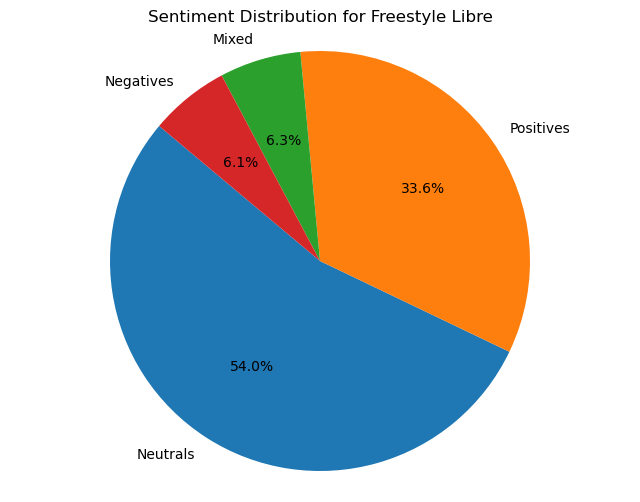

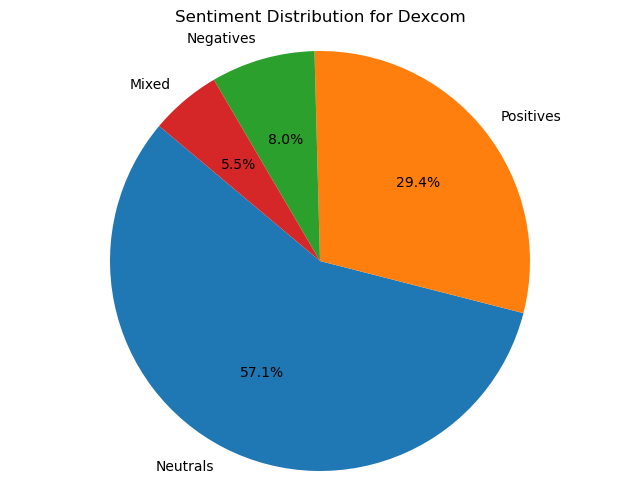

In [250]:
# Calculate sentiment counts for Freestyle data
freestyle_sentiment_counts = freestyle_data['Sentiment'].value_counts()

# Create a pie chart for sentiment distribution
plt.figure(figsize=(8, 6))
plt.pie(freestyle_sentiment_counts, labels=freestyle_sentiment_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Sentiment Distribution for Freestyle Libre')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

# Calculate sentiment counts for Dexcom data
dexcom_sentiment_counts = dexcom_data['Sentiment'].value_counts()

# Create a pie chart for Dexcom sentiment distribution
plt.figure(figsize=(8, 6))
plt.pie(dexcom_sentiment_counts, labels=dexcom_sentiment_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Sentiment Distribution for Dexcom')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

In [232]:
#we are removing some frequently occuring words to better understand the context of the texts as we have already filtered the products
frequent_words_products = ['dexcom', 'freestyle', 'libre', 'continuous', 'monitoring', 'monitor', 'blood','sugar']
def remove_frequent_words_from_products(text):
    # Split the tweet into words
    words = text.split()
    # Remove frequent words
    words = [word for word in words if word.lower() not in frequent_words_products and word.lower() not in stop_words]
    # Join the remaining words back into a string
    preprocessed_text = ' '.join(words)
    return preprocessed_text

# Apply the preprocess_text_column function to the text column and store the result in a new column
dexcom_data['Sound Bite Text'] = df['Sound Bite Text'].apply(remove_frequent_words_from_products)
freestyle_data['Sound Bite Text']= df['Sound Bite Text'].apply(remove_frequent_words_from_products)

In [235]:

all_narratives_dexcom = ' '.join(dexcom_data['Sound Bite Text'])
words_dexcom = word_tokenize(all_narratives_dexcom)
words_dexcom = [word.lower() for word in words_dexcom if word.isalpha() and word.lower() not in stop_words]

# Generate bigrams and trigrams
bigram_list_dexcom = list(bigrams(words_dexcom))
trigram_list_dexcom = list(trigrams(words_dexcom))

# Calculate frequencies of bigrams and trigrams
bigram_freq_dexcom = FreqDist(bigram_list_dexcom)
trigram_freq_dexcom = FreqDist(trigram_list_dexcom)

# Print most common bigrams and trigrams
print("Top 20 most common bigrams:")
print(bigram_freq_dexcom.most_common(20))

print("\nTop 20 most common trigrams:")
print(trigram_freq_dexcom.most_common(20))

Top 20 most common bigrams:
[(('insulin', 'pump'), 618), (('dont', 'know'), 470), (('closed', 'loop'), 450), (('control', 'iq'), 405), (('years', 'ago'), 364), (('tandem', 'tslim'), 350), (('apple', 'watch'), 344), (('feel', 'like'), 315), (('make', 'sure'), 307), (('tandem', 'pump'), 294), (('much', 'better'), 273), (('new', 'sensor'), 271), (('tslim', 'pump'), 263), (('type', 'diabetes'), 255), (('times', 'day'), 239), (('finger', 'stick'), 232), (('loop', 'system'), 226), (('test', 'strips'), 225), (('even', 'though'), 222), (('first', 'time'), 218)]

Top 20 most common trigrams:
[(('closed', 'loop', 'system'), 202), (('tandem', 'tslim', 'pump'), 89), (('tslim', 'control', 'iq'), 56), (('durable', 'medical', 'equipment'), 56), (('use', 'tandem', 'tslim'), 55), (('tslim', 'insulin', 'pump'), 55), (('insurance', 'wont', 'cover'), 44), (('long', 'acting', 'insulin'), 40), (('put', 'new', 'sensor'), 39), (('hybrid', 'closed', 'loop'), 36), (('people', 'type', 'diabetes'), 36), (('every'

In [233]:
#N-grams for Dexcom
all_narratives_dexcom = ' '.join(dexcom_data[dexcom_data['Sentiment'] == 'Positives']['Sound Bite Text'])
words_dexcom = word_tokenize(all_narratives_dexcom)
words_dexcom = [word.lower() for word in words_dexcom if word.isalpha() and word.lower() not in stop_words]

# Generate bigrams and trigrams
bigram_list_dexcom = list(bigrams(words_dexcom))
trigram_list_dexcom = list(trigrams(words_dexcom))

# Calculate frequencies of bigrams and trigrams
bigram_freq_dexcom = FreqDist(bigram_list_dexcom)
trigram_freq_dexcom = FreqDist(trigram_list_dexcom)

# Print most common bigrams and trigrams
print("Top 20 most common bigrams:")
print(bigram_freq_dexcom.most_common(20))

print("\nTop 20 most common trigrams:")
print(trigram_freq_dexcom.most_common(20))

Top 20 most common bigrams:
[(('insulin', 'pump'), 238), (('closed', 'loop'), 162), (('control', 'iq'), 151), (('years', 'ago'), 136), (('tandem', 'tslim'), 129), (('much', 'better'), 122), (('apple', 'watch'), 119), (('dont', 'know'), 117), (('make', 'sure'), 101), (('type', 'diabetes'), 99), (('feel', 'like'), 98), (('times', 'day'), 96), (('tslim', 'pump'), 95), (('highly', 'recommend'), 87), (('tandem', 'pump'), 85), (('loop', 'system'), 85), (('finger', 'sticks'), 79), (('every', 'minutes'), 76), (('good', 'luck'), 75), (('medtronic', 'pump'), 75)]

Top 20 most common trigrams:
[(('closed', 'loop', 'system'), 76), (('tandem', 'tslim', 'pump'), 35), (('use', 'tandem', 'tslim'), 32), (('tslim', 'control', 'iq'), 21), (('insurance', 'wont', 'cover'), 20), (('tslim', 'insulin', 'pump'), 20), (('never', 'go', 'back'), 18), (('multiple', 'daily', 'injections'), 17), (('life', 'much', 'easier'), 16), (('long', 'acting', 'insulin'), 15), (('diagnosed', 'years', 'ago'), 14), (('put', 'new'

In [234]:
#Complaints regarding dexcom
all_narratives_dexcom = ' '.join(dexcom_data[dexcom_data['Sentiment'] == 'Negatives']['Sound Bite Text'])
words_dexcom = word_tokenize(all_narratives_dexcom)
words_dexcom = [word.lower() for word in words_dexcom if word.isalpha() and word.lower() not in stop_words]

# Generate bigrams and trigrams
bigram_list_dexcom = list(bigrams(words_dexcom))
trigram_list_dexcom = list(trigrams(words_dexcom))

# Calculate frequencies of bigrams and trigrams
bigram_freq_dexcom = FreqDist(bigram_list_dexcom)
trigram_freq_dexcom = FreqDist(trigram_list_dexcom)

# Print most common bigrams and trigrams
print("Top 20 most common bigrams:")
print(bigram_freq_dexcom.most_common(20))

print("\nTop 20 most common trigrams:")
print(trigram_freq_dexcom.most_common(20))

Top 20 most common bigrams:
[(('dont', 'know'), 43), (('every', 'time'), 36), (('insulin', 'pump'), 34), (('closed', 'loop'), 33), (('cant', 'get'), 29), (('dont', 'use'), 29), (('doesnt', 'work'), 27), (('new', 'sensor'), 26), (('new', 'one'), 25), (('make', 'sure'), 23), (('much', 'better'), 23), (('even', 'though'), 23), (('control', 'iq'), 22), (('finger', 'stick'), 21), (('finger', 'prick'), 21), (('first', 'time'), 21), (('loop', 'system'), 20), (('finger', 'sticks'), 20), (('times', 'day'), 20), (('dont', 'want'), 20)]

Top 20 most common trigrams:
[(('closed', 'loop', 'system'), 19), (('hybrid', 'closed', 'loop'), 7), (('tslim', 'control', 'iq'), 6), (('put', 'new', 'one'), 6), (('durable', 'medical', 'equipment'), 5), (('every', 'three', 'months'), 5), (('app', 'doesnt', 'work'), 4), (('sensor', 'first', 'time'), 4), (('tandem', 'tslim', 'pump'), 4), (('put', 'new', 'sensor'), 4), (('every', 'single', 'time'), 4), (('tandem', 'customer', 'service'), 4), (('hours', 'new', 'sens

In [236]:
#N-grams for freestyle libre
all_narratives_freestyle = ' '.join(freestyle_data['Sound Bite Text'])
words_freestyle = word_tokenize(all_narratives_freestyle)
words_freestyle = [word.lower() for word in words_freestyle if word.isalpha() and word.lower() not in stop_words]

# Generate bigrams and trigrams
bigram_list_freestyle = list(bigrams(words_freestyle))
trigram_list_freestyle = list(trigrams(words_freestyle))

# Calculate frequencies of bigrams and trigrams
bigram_freq_freestyle = FreqDist(bigram_list_freestyle)
trigram_freq_freestyle = FreqDist(trigram_list_freestyle)

# Print most common bigrams and trigrams
print("Top 20 most common bigrams:")
print(bigram_freq_freestyle.most_common(20))

print("\nTop 20 most common trigrams:")
print(trigram_freq_freestyle.most_common(20))


Top 20 most common bigrams:
[(('type', 'diabetes'), 225), (('insulin', 'pump'), 190), (('dont', 'know'), 188), (('test', 'strips'), 138), (('times', 'day'), 135), (('finger', 'prick'), 133), (('back', 'brace'), 128), (('finger', 'sticks'), 125), (('finger', 'pricks'), 120), (('started', 'using'), 111), (('years', 'ago'), 106), (('make', 'sure'), 104), (('apple', 'watch'), 103), (('much', 'better'), 101), (('every', 'minutes'), 96), (('medical', 'supply'), 95), (('high', 'low'), 95), (('finger', 'stick'), 92), (('even', 'though'), 90), (('feel', 'like'), 89)]

Top 20 most common trigrams:
[(('free', 'back', 'brace'), 86), (('medical', 'supply', 'brooklyn'), 63), (('people', 'type', 'diabetes'), 35), (('medical', 'supply', 'bronx'), 29), (('insurance', 'wont', 'cover'), 29), (('closed', 'loop', 'system'), 29), (('insurance', 'doesnt', 'cover'), 27), (('one', 'back', 'injury'), 22), (('every', 'two', 'weeks'), 19), (('times', 'per', 'day'), 19), (('making', 'use', 'back'), 17), (('knee', 

In [238]:
dexcom_text = ' '.join(dexcom_data['Sound Bite Text'].astype(str))

# Combine all text related to Freestyle Libre into one string
freestyle_text = ' '.join(freestyle_data['Sound Bite Text'].astype(str))

# TF-IDF Vectorizer
tfidf = TfidfVectorizer(stop_words='english', max_features=100)

# Fit and transform Dexcom text data
dexcom_tfidf = tfidf.fit_transform([dexcom_text])

# Fit and transform Freestyle Libre text data
freestyle_tfidf = tfidf.fit_transform([freestyle_text])

# Get feature names from TF-IDF for Dexcom and Freestyle Libre
dexcom_feature_names = tfidf.get_feature_names_out()
freestyle_feature_names = tfidf.get_feature_names_out()

# Find top features for Dexcom and Freestyle Libre
top_dexcom_features = dexcom_feature_names[np.argsort(-dexcom_tfidf.toarray()[0])][:20]
top_freestyle_features = freestyle_feature_names[np.argsort(-freestyle_tfidf.toarray()[0])][:20]

print("Top features for Dexcom:")
print(top_dexcom_features)

print("\nTop features for Freestyle Libre:")
print(top_freestyle_features)

Top features for Dexcom:
['people' 'doesnt' 'insulin' 'try' 'great' 'diabetic' 'thing' 'really'
 'years' 'like' 'hours' 'ago' 'finger' 'use' 'read' 'health' 'control'
 'data' 'new' 'months']

Top features for Freestyle Libre:
['use' 'sensor' 'like' 'using' 'diabetes' 'dont' 'insulin' 'time' 'day'
 'app' 'know' 'insurance' 'pump' 'sensors' 'really' 'g6' 'low' 'phone'
 'levels' 'need']


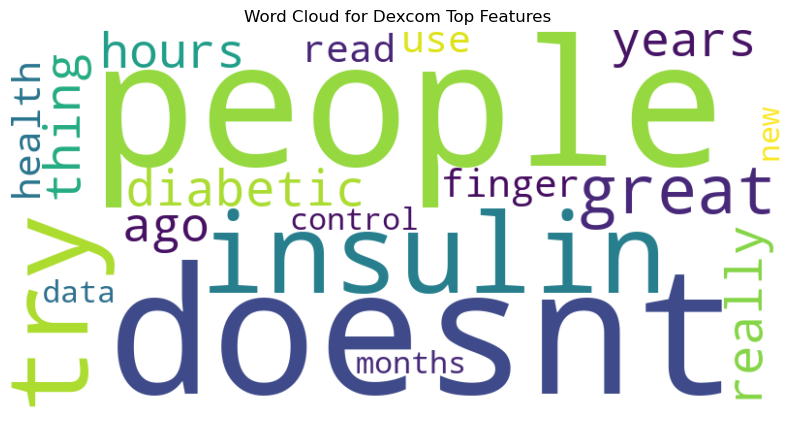

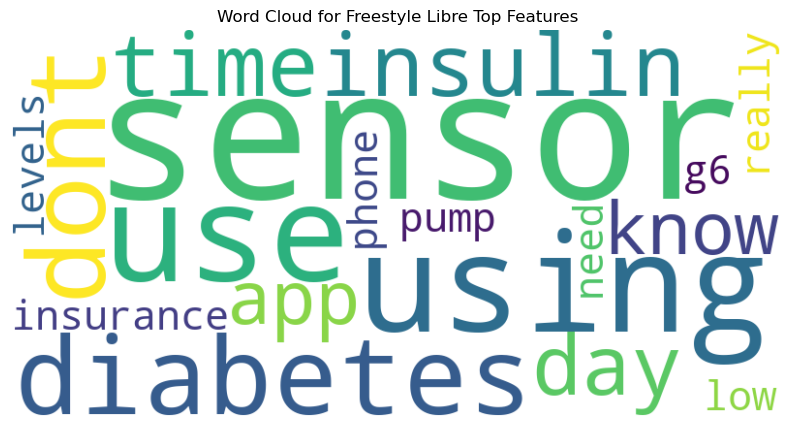

In [239]:
dexcom_wordcloud_text = ' '.join(top_dexcom_features)
freestyle_wordcloud_text = ' '.join(top_freestyle_features)

# Create word clouds for Dexcom
wordcloud_dexcom = WordCloud(width=800, height=400, background_color='white').generate(dexcom_wordcloud_text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_dexcom, interpolation='bilinear')
plt.title('Word Cloud for Dexcom Top Features')
plt.axis('off')
plt.show()

# Create word clouds for Freestyle Libre
wordcloud_freestyle = WordCloud(width=800, height=400, background_color='white').generate(freestyle_wordcloud_text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud_freestyle, interpolation='bilinear')
plt.title('Word Cloud for Freestyle Libre Top Features')
plt.axis('off')
plt.show()

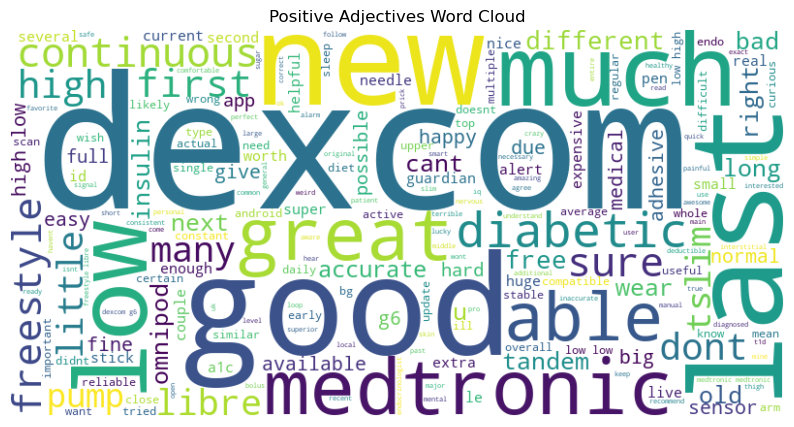

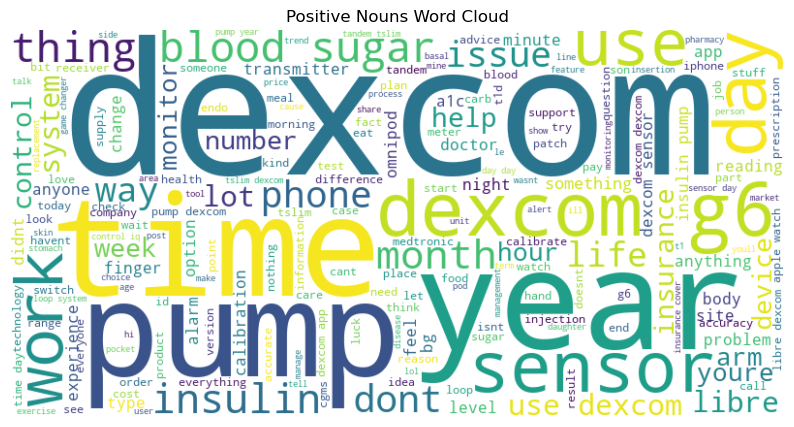

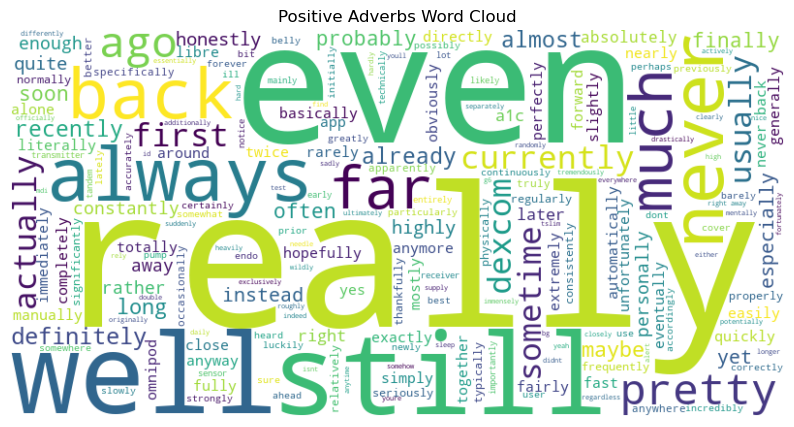

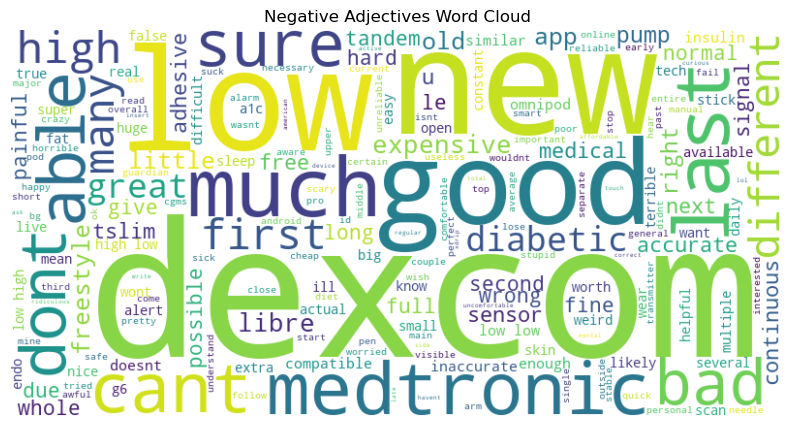

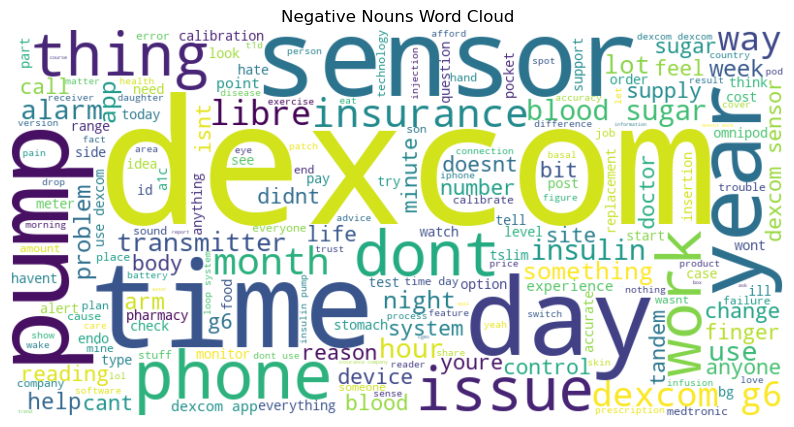

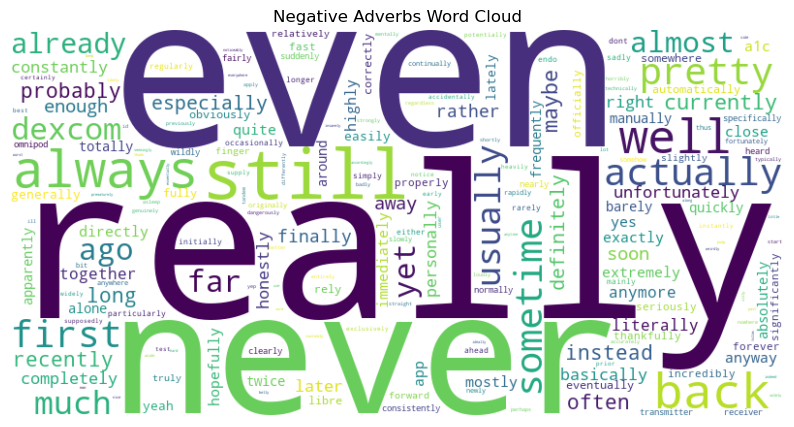

In [257]:
def generate_word_cloud(data, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(data))
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

generate_word_cloud(dexcom_data[dexcom_data['Sentiment'] == 'Positives']['Adjectives'].explode().dropna(), 'Positive Adjectives Word Cloud')

# Visualize Nouns
generate_word_cloud(dexcom_data[dexcom_data['Sentiment'] == 'Positives']['Nouns'].explode().dropna(), 'Positive Nouns Word Cloud')

# Visualize Adverbs
generate_word_cloud(dexcom_data[dexcom_data['Sentiment'] == 'Positives']['Adverbs'].explode().dropna(), 'Positive Adverbs Word Cloud')



generate_word_cloud(dexcom_data[dexcom_data['Sentiment'] == 'Negatives']['Adjectives'].explode().dropna(), 'Negative Adjectives Word Cloud')

# Visualize Nouns
generate_word_cloud(dexcom_data[dexcom_data['Sentiment'] == 'Negatives']['Nouns'].explode().dropna(), 'Negative Nouns Word Cloud')

# Visualize Adverbs
generate_word_cloud(dexcom_data[dexcom_data['Sentiment'] == 'Negatives']['Adverbs'].explode().dropna(), 'Negative Adverbs Word Cloud')

In [85]:
from collections import defaultdict
def extract_syntactic_structures(data):
    noun_adj_pairs = defaultdict(list)
    adverbs = []
    
    for sentence in data:
        pos_tags = nltk.pos_tag(sentence)
        
        for i in range(len(pos_tags)):
            word, pos = pos_tags[i]
            
            if pos == 'JJ' and i > 0 and pos_tags[i - 1][1] == 'NN':
                noun = pos_tags[i - 1][0]
                noun_adj_pairs[noun].append(word)
                
            elif pos == 'RB':
                adverbs.append(word)
    
    return dict(noun_adj_pairs), adverbs

# Extract noun-adjective combinations and adverbs
noun_adj_pairs, adverbs = extract_syntactic_structures(df['Lemmatized'])

# Print noun-adjective combinations
for noun, adjectives in noun_adj_pairs.items():
    print(f"{noun}: {', '.join(adjectives)}")

# Print adverbs
print("Adverbs:", ', '.join(adverbs))

number: great, great, knee, good, goddamn, great, stable, mean, old, high, knee, diabetic, american, fit, good, overcompensate, great, measurement, inclinic, inclinic, many, excellent, right, high, great, available, user, low, everyday, identical, front, previous, safe, wear, stable, high, good, chart, stable, reflect, high, usual, good, likely, social, possible, curious, cgms, freestyle, give, solid, able, arent, arent, healthy, accurate, vary, fine, isnt, continuous, direct, obese, carbs, arent, low, nh, email, arent, angry, app, timeline, stellar, similar, good, random, possible, true, live, third, dangerous, able, damn, erratic, nondiabetic, high, usual, low, low, span, local, different, dont, dangerous, different, precgm, third, routine, right, different, high, didnt, normal, good, normal, helpful, tslim, great, libre, last, cgm, freestyle, second, decent, website, perfect, concerned, high, high, sure, regular, arrow, overall, steady, meal, tight, low, patient, sure, much, high, p

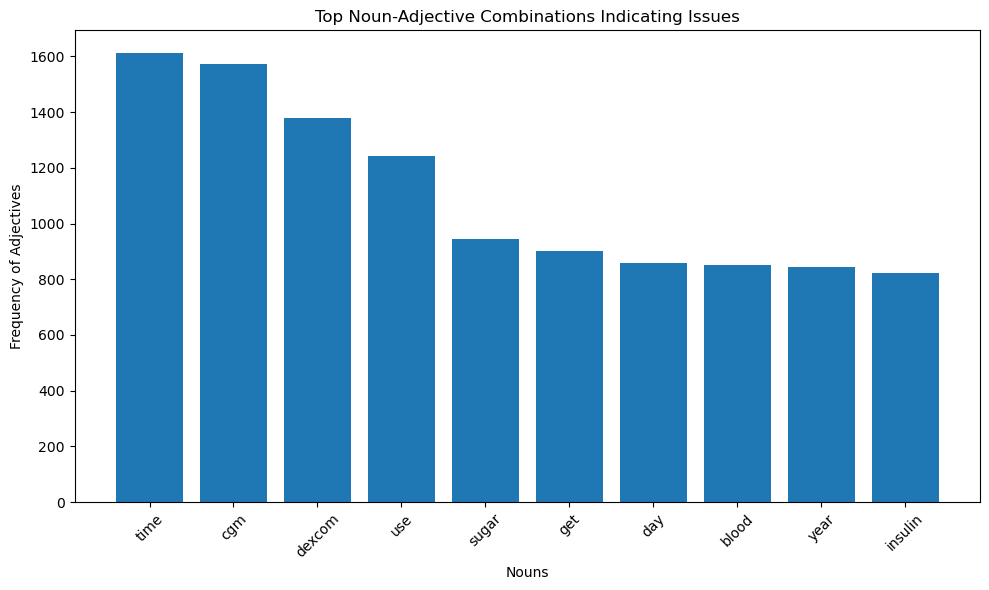

In [258]:


# Create a bar plot for noun-adjective combinations
noun_counts = {noun: len(adjs) for noun, adjs in noun_adj_pairs.items()}
sorted_nouns = sorted(noun_counts, key=noun_counts.get, reverse=True)[:10]  # Top 10 nouns

plt.figure(figsize=(10, 6))
plt.bar(sorted_nouns, [noun_counts[noun] for noun in sorted_nouns])
plt.xlabel('Nouns')
plt.ylabel('Frequency of Adjectives')
plt.title('Top Noun-Adjective Combinations Indicating Issues')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [261]:
dexcom_data = df[df['Sound Bite Text'].str.contains('Dexcom', case=False)]
freestyle_data = df[df['Sound Bite Text'].str.contains('Freestyle|Libre', case=False)]

# Step 2: Identify Praises and Complaints using VADER
def identify_praises_complaints_vader(data):
    praises = []
    complaints = []
    for text in data['Sound Bite Text']:
        sentiment_score = sid.polarity_scores(text)
        if sentiment_score['compound'] > 0.2:
            praises.append(text)
        elif sentiment_score['compound'] < -0.2:
            complaints.append(text)
    return praises, complaints

dexcom_praises, dexcom_complaints = identify_praises_complaints_vader(dexcom_data)
freestyle_praises, freestyle_complaints = identify_praises_complaints_vader(freestyle_data)

# Display Praises and Complaints for Dexcom and Freestyle Libre
print("Praises for Dexcom:")
print(dexcom_praises[:20])

print("\nComplaints for Dexcom:")
print(dexcom_complaints[:20])

print("\nPraises for Freestyle Libre:")
print(freestyle_praises[0:20])

print("\nComplaints for Freestyle Libre:")
print(freestyle_complaints[0:20])

Praises for Dexcom:
['numbers great estimated a1c 7ish doesnt care say wants actual labs look dexcom stuff take word', 'tried little side effects help insulin resistance found tandom dexcom superior', 'lunch ate 1030am 1 unit novolog insulin via pump grilled chicken feta cheese carrots apples macadamia nuts mixed together drizzled briannassalad real french vinaigrette dressing kids see people eating alone always say feel bad tell probably enjoying yep enjoying simple simple food little insulin required especially since outside heat hours going back t1d type1diabetes typeonediabetes diabetes diabetesawareness lowcarb keto easyrecipes easylunch lunchalone momlife momfood type1mom typeonemom fitmom selfcare healthymom dexcom looping insulin bloodsugar dominatingtype1diabetes', 'id like new pancreas please type1diabetes dexcomg6 dexcomwarrior t1strong type1warrior diabetics fitness fitnessinfluencer diabeticsofinstagram t1dlookslikeme diabadass diabeticswholift fitdiabetic fitnessgirl', 'c

In [260]:
dexcom_complaints[0:10]

['ran characters youtuberwgl2pdhqim ill also say newly diagnosed idea feel react etc always resource use dexcom g6 omnipod system desperately trying upgrade new closed loop omnipod system',
 'tslim pump dexcom usually numbers 80150 today theyve getting stuck 140160 dont know even ran workout gym numbers didnt stay eat lot carbs morning usually wouldnt spike high numbers usually come quick recommendations days like stress doesnt seem real reason',
 'got dexcom definitely helping lot showing fast bounce thats trying change ways eat still little nervous getting pump idea maybe hypophobia bad hypos caused memory problems affected thinking afraid control dose',
 'honestly pump imo worse sensor legit forget dexcom wear thigh seriously cant feel hand pump sticks get uncomfortable also dont changed often pump imo makes bit bearablechanging pump site every 3 days completely annoying hate right wyou',
 'use dexcom libre wife put mine back shoulder blades never really catches also cant scratch sl

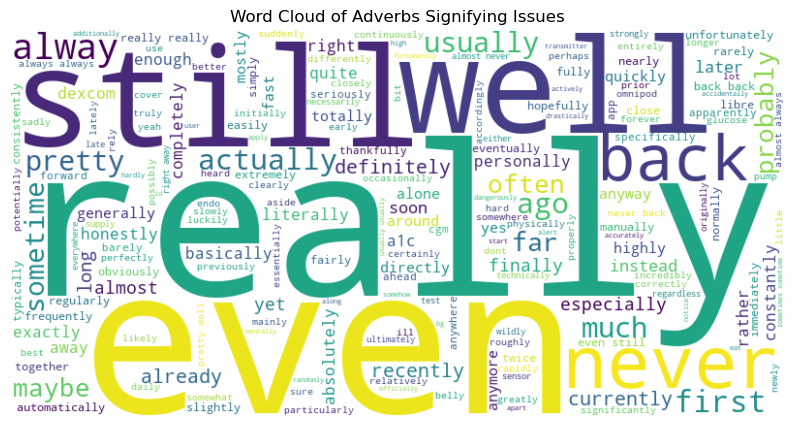

In [88]:


# Create a word cloud for adverbs
adverbs_text = ' '.join(adverbs)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(adverbs_text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Adverbs Signifying Issues')
plt.show()

To identify the most crucial benefits of CGMs for diabetes patients, you can perform sentiment analysis to determine the sentiment associated with discussions around CGMs. Positive sentiments often correlate with benefits or advantages.



Identifying unmet needs involves discovering topics or specific discussions where patients express dissatisfaction or desires for features, services, or aspects they're currently not receiving from CGMs.

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import pos_tag
import matplotlib.pyplot as plt

# Download NLTK resources if not already downloaded
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

# Assuming you have a list of text data in 'positive_sentiments' and 'negative_sentiments' variables

# Function to preprocess text and extract specific POS words
def extract_pos_words(texts, pos_to_keep=('NN', 'NNS', 'JJ', 'VB')):
    pos_words = []
    stop_words = set(stopwords.words('english'))
    for text in texts:
        words = word_tokenize(text)
        words_pos = pos_tag(words)
        for word, pos in words_pos:
            if pos in pos_to_keep and word.lower() not in stop_words and word.isalpha():
                pos_words.append(word.lower())
    return pos_words

# Extract POS words from positive and negative sentiments
positive_pos_words = extract_pos_words(positive_sentiments)
negative_pos_words = extract_pos_words(negative_sentiments)

# Generate WordCloud for positive sentiments (benefits)
positive_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(positive_pos_words))

# Generate WordCloud for negative sentiments (unmet needs)
negative_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(negative_pos_words))

# Display WordCloud for positive sentiments (benefits)
plt.figure(figsize=(10, 6))
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Positive Sentiments (Benefits)')
plt.show()

# Display WordCloud for negative sentiments (unmet needs)
plt.figure(figsize=(10, 6))
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Negative Sentiments (Unmet Needs)')
plt.show()


In [ ]:
from collections import Counter
def plot_top_words(words_list, title):
    word_counts = Counter(words_list)
    top_words = word_counts.most_common(10)  # Change the number to display more or fewer words
    
    # Extract words and counts for plotting
    words, counts = zip(*top_words)
    
    plt.figure(figsize=(10, 6))
    plt.bar(words, counts, color='skyblue')
    plt.title(title)
    plt.xlabel('Words')
    plt.ylabel('Occurrences')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Plot top words for positive sentiments (benefits)
plot_top_words(positive_pos_words, 'Top Words in Positive Sentiments (Benefits)')

# Plot top words for negative sentiments (unmet needs)
plot_top_words(negative_pos_words, 'Top Words in Negative Sentiments (Unmet Needs)')

In [ ]:
from itertools import combinations

stop_words = set(stopwords.words('english'))
punc = set(string.punctuation)
def preprocess(text):
    tokens = word_tokenize(text)
    tagged = pos_tag(tokens)
    filtered_tags = [(word, tag) for word, tag in tagged if tag not in ['DT', 'IN', 'TO'] and word not in stop_words and word not in punc]  # Filter out determiners, prepositions, and infinitive marker
    return [word for word, tag in filtered_tags]

def generate_co_occurrence(texts):
    word_pairs = []
    for text in texts:
        words = preprocess(text)
        word_pairs.extend(combinations(words, 2))  # Generate pairs of words
    return word_pairs

# Generate co-occurrence for positive and negative sentiments
positive_co_occurrence = generate_co_occurrence(positive_sentiments)
negative_co_occurrence = generate_co_occurrence(negative_sentiments)

# Count co-occurrences for positive sentiments
positive_co_occurrence_counts = Counter(positive_co_occurrence)
positive_co_occurrence_df = pd.DataFrame(positive_co_occurrence_counts.items(),
                                         columns=['Word Pair', 'Co-Occurrence Count (Positive)'])

# Count co-occurrences for negative sentiments
negative_co_occurrence_counts = Counter(negative_co_occurrence)
negative_co_occurrence_df = pd.DataFrame(negative_co_occurrence_counts.items(),
                                         columns=['Word Pair', 'Co-Occurrence Count (Negative)'])

# Display top co-occurring word pairs for positive sentiments
top_positive_co_occurrences = positive_co_occurrence_df.sort_values(by='Co-Occurrence Count (Positive)', ascending=False).head(10)
print("Top Co-Occurring Word Pairs for Positive Sentiments:")
print(top_positive_co_occurrences)

# Display top co-occurring word pairs for negative sentiments
top_negative_co_occurrences = negative_co_occurrence_df.sort_values(by='Co-Occurrence Count (Negative)', ascending=False).head(10)
print("\nTop Co-Occurring Word Pairs for Negative Sentiments:")
print(top_negative_co_occurrences)

In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
for topic_id in range(num_topics):
    wordcloud = WordCloud(background_color='white').generate_from_frequencies(dict(lda_model.show_topic(topic_id, topn=20)))
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.title(f"Topic {topic_id} Word Cloud")
    plt.axis("off")

# Method 2: Bar Plots for Word Distribution in Topics
fig, axes = plt.subplots(num_topics, 1, figsize=(10, 6*num_topics))
for i in range(num_topics):
    sns.barplot(x='word', y='importance', data=pd.DataFrame(lda_model.show_topic(i, topn=10), columns=['word', 'importance']), ax=axes[i])
    axes[i].set_title(f"Topic {i} Word Distribution")
    axes[i].set_ylabel('Importance')
    axes[i].set_xlabel('Word')

# Method 3: Interactive Topic Modeling Visualization using pyLDAvis
lda_display = gensimvis.prepare(lda_model, corpus, dictionary, sort_topics=False)
pyLDAvis.display(lda_display)

# Method 4: Topic Composition across Documents (replace 'your_column' with the appropriate column)
topic_distribution = lda_model.get_document_topics(corpus)
df['Topic'] = [max(prob, key=lambda x: x[1])[0] for prob in topic_distribution]
sns.histplot(data=df, x='Topic', kde=True)

# Method 5: Topic Trend Analysis (replace 'your_date_column' with the appropriate date column)
# ...

# Method 6: Keyword Extraction within Topics
# ...

# Method 7: Sentiment Analysis per Topic
# ...

# Method 8: Association Rules Analysis
# ...

plt.tight_layout()
plt.show()

In [ ]:
df

Based on these word distributions, you might interpret Topic 0 as related to sugar levels, Topic 1 as about monitoring diabetes, Topic 2 about specific devices or apps, Topic 3 concerning insurance and medication, and Topic 4 focused on specific brands or devices.

In [ ]:
df['Media Link']